In [1]:
%load_ext autoreload

%autoreload 2
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
from spikeA.Session import *
from spikeA.Spike_train_loader import Spike_train_loader
from spikeA.Cell_group import Cell_group
from spikeA.Animal_pose import Animal_pose
from spikeA.Session import Session
from spikeA.Dat_file_reader import Dat_file_reader
from spikeA.Intervals import Intervals
from spikeA.Spike_train import Spike_train
from spikeA.Spike_waveform import Spike_waveform
from tqdm import tqdm
import os.path
import matplotlib.gridspec as gridspec
from matplotlib.backends.backend_pdf import PdfPages

In [2]:
mouse="bt3565"
date="25082021"
name=f"{mouse}-{date}-0105"
path=f"/adata/electro/{mouse}/{name}/"

Check the files

## Get a Session object and load spikes

In [3]:
ses = Kilosort_session(name=name,path=path)
ses.load_parameters_from_files()
print(ses)

<class 'spikeA.Session.Kilosort_session'>
name = bt3565-25082021-0105
path = /adata/electro/bt3565/bt3565-25082021-0105
subject = bt3565
session_dat_time = 2021-08-25 01:05:00
fileBase = /adata/electro/bt3565/bt3565-25082021-0105/bt3565-25082021-0105
file_names = {'par': '/adata/electro/bt3565/bt3565-25082021-0105/bt3565-25082021-0105.par', 'desen': '/adata/electro/bt3565/bt3565-25082021-0105/bt3565-25082021-0105.desen', 'desel': '/adata/electro/bt3565/bt3565-25082021-0105/bt3565-25082021-0105.desel', 'sampling_rate': '/adata/electro/bt3565/bt3565-25082021-0105/bt3565-25082021-0105.sampling_rate_dat', 'px_per_cm': '/adata/electro/bt3565/bt3565-25082021-0105/bt3565-25082021-0105.px_per_cm', 'params': '/adata/electro/bt3565/bt3565-25082021-0105/params.py', 'amplitudes': '/adata/electro/bt3565/bt3565-25082021-0105/amplitudes.npy', 'channel_map': '/adata/electro/bt3565/bt3565-25082021-0105/channel_map.npy', 'channel_positions': '/adata/electro/bt3565/bt3565-25082021-0105/channel_positions.

In [4]:
stl = Spike_train_loader()
stl.load_spike_train_kilosort(ses)
cg = Cell_group(stl)

## Create a pose file 

In [6]:
ap = Animal_pose(ses)
if not os.path.exists(f"{ses.fileBase}.pose.npy"):
    ap.pose_from_positrack_files(ses=ses, interpolation_frequency_hz = 50,extension="positrack")
    ap.save_pose_to_file() # save the file for next time
else:
    ap.load_pose_from_file()

Plot the path of the animal to see if it was loaded correctly. All trials are plotted on top of each other here.

Text(0, 0.5, 'y')

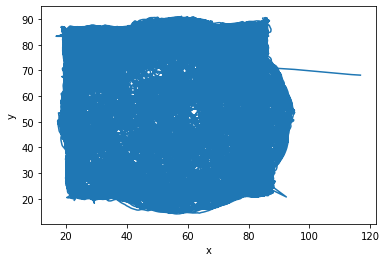

In [7]:
plt.plot(ap.pose[:,1],ap.pose[:,2])
plt.xlabel("x")
plt.ylabel("y")
#plt.gca().set_aspect('equal', adjustable='box')

Plot the instantaneous firing rate to see if neurons are stable over the session.

Plot the head-direction of the animal and its position a short segment.

Now we need to set the SpatialProperties object of each Neuron objects of the CellGroup.
Then we can get information score for each neuron from a firing rate map without smoothing.
We recalculate the maps with smoothing for display purposes.

Text(0.5, 0, 'Head direction (deg)')

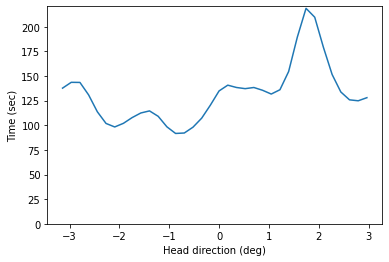

In [8]:
ap.head_direction_occupancy_histogram()
plt.plot(ap.hd_occupancy_bins[:-1],ap.hd_occupancy_histogram)
plt.ylim(0,np.max(ap.hd_occupancy_histogram)+2)
plt.ylabel("Time (sec)")
plt.xlabel("Head direction (deg)")

## Limit analysis to a particular trial

You can get the time intervals for each trial from the session object.

* Get the time at which each trial starts and ends
* Set the intervals in the spike train object. 
* Set the intervals in the animal_pose object. 

In [913]:
print(ses.trial_intervals.inter)
print(ses.desen)
sqr70_indices = [i for i, j in enumerate(ses.desen) if j == 'sqr70']
circ80_indices = [i for i, j in enumerate(ses.desen) if j == 'circ80']

first_sqr70_inter = ses.trial_intervals.inter[sqr70_indices[0:1],:] # first sqr70
last_sqr70_inter = ses.trial_intervals.inter[sqr70_indices[-1:],:] # last sqr70
first_circ80_inter = ses.trial_intervals.inter[circ80_indices[0:1],:] # first circ80

print(first_sqr70_inter)
print(last_sqr70_inter)
print(first_circ80_inter)

[[   0.      1219.89595]
 [1219.896   1846.11595]
 [1846.116   3108.77995]
 [3108.78    3741.37195]
 [3741.372   4993.34395]]
['sqr70', 'rb', 'circ80', 'rb', 'sqr70']
[[   0.      1219.89595]]
[[3741.372   4993.34395]]
[[1846.116   3108.77995]]


Loading original pose from /adata/electro/bt3565/bt3565-25082021-0105/bt3565-25082021-0105.pose.npy


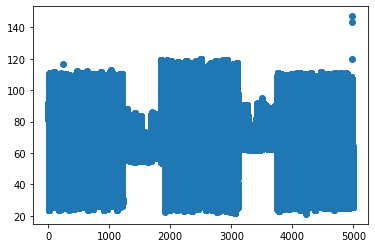

Time 4994.34


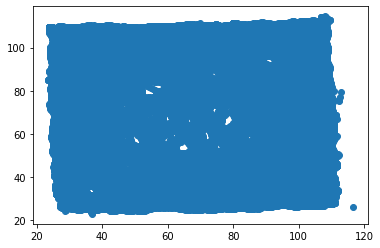

Time 1219.89595


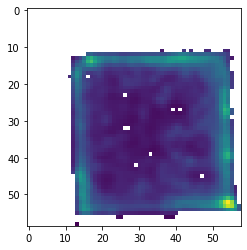

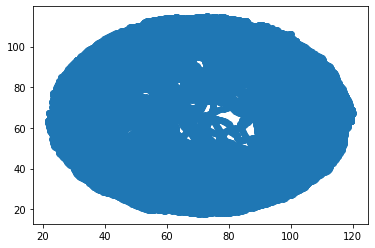

Time 1262.66395


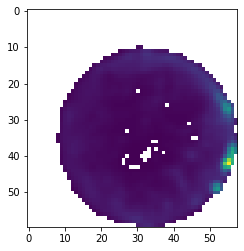

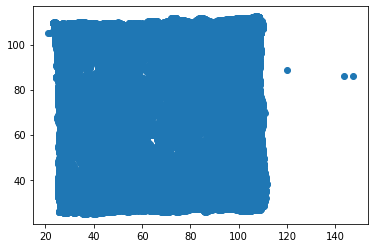

Time 1251.9719500000006


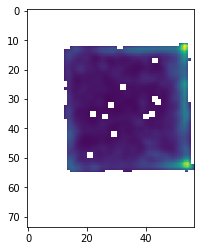

In [914]:
ap = Animal_pose(ses)
ap.load_pose_from_file()

#plot x-coordinate vs time
plt.scatter(ap.pose[:,0],ap.pose[:,1])
plt.show()
print("Time {}".format(ap.intervals.total_interval_duration_seconds()))


ap.set_intervals(first_sqr70_inter)
plt.scatter(ap.pose[:,1],ap.pose[:,2])
plt.show()
print("Time {}".format(ap.intervals.total_interval_duration_seconds()))
ap.occupancy_map_2d()
plt.imshow(ap.occupancy_map)
plt.show()


ap.unset_intervals()
ap.set_intervals(first_circ80_inter)
plt.scatter(ap.pose[:,1],ap.pose[:,2])
#xmax = ymax = max(np.nanmax(ap.pose[:,1]), np.nanmax(ap.pose[:,2])); xmin = ymin = min(np.nanmin(ap.pose[:,1]), np.nanmin(ap.pose[:,2]))
#plt.xlim([xmin, xmax]); plt.ylim([ymin, ymax])
plt.show()
print("Time {}".format(ap.intervals.total_interval_duration_seconds()))
ap.occupancy_map_2d()
plt.imshow(ap.occupancy_map)
plt.show()


ap.unset_intervals()
ap.set_intervals(last_sqr70_inter)
plt.scatter(ap.pose[:,1],ap.pose[:,2])
plt.show()
print("Time {}".format(ap.intervals.total_interval_duration_seconds()))
ap.occupancy_map_2d()
plt.imshow(ap.occupancy_map)
plt.show()

Plot the speed of the animal

Loading original pose from /adata/electro/bt3565/bt3565-25082021-0105/bt3565-25082021-0105.pose.npy
Median speed: 20.228418852251334


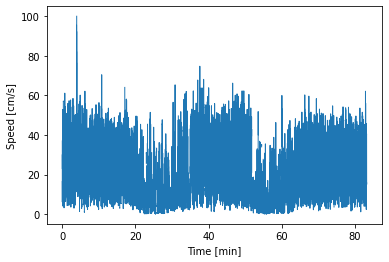

In [915]:
ap = Animal_pose(ses)
ap.load_pose_from_file()
ap.unset_intervals()
if ap.speed is None:
    ap.speed_from_pose(sigma=5)

print("Median speed:", np.median(ap.speed[~np.isnan(ap.speed)]))
speed = ap.speed
speed[speed>100] = np.nan
time = ap.pose[:,0]/60 # in sec

plt.plot(time, speed, marker='', linewidth=1, markersize=1)
plt.xlabel("Time [min]")
plt.ylabel("Speed [cm/s]")
plt.show()

In [916]:
n = cg.neuron_list[0]
df = Dat_file_reader(file_names=[f"{path}{mouse}-{date}-0105.dat"], n_channels=65)
sw = Spike_waveform(dat_file=df, spike_train=n.spike_train)

In [917]:
sw.mean_waveform(block_size=200, channels=range(64)) #calculate the mean waveforms for all channels over a time interval of 200 ms (greater time intervals gave errors)

[55, 56, 62, 49, 63, 48, 60, 51]


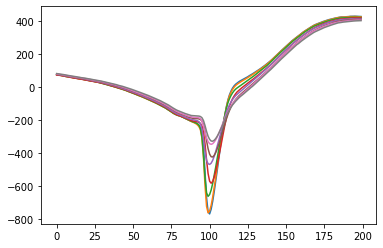

In [918]:
# plot only the 8 channels with the highest amplitude
n_channels = 8 #number of channels to plot
amplitudes = [abs(max(sw.mean_waveforms[n,:])) + abs(min(sw.mean_waveforms[n,:])) for n in range(sw.mean_waveforms.shape[0])]
channel_amp_list = [(c,a) for c,a in zip(amplitudes, range(sw.mean_waveforms.shape[0]))]
channel_amp_dict = dict(channel_amp_list)
amp_sorted_channels = [channel_amp_dict[a] for a in sorted(channel_amp_dict)]
channels = amp_sorted_channels[:(sw.mean_waveforms.shape[0]-n_channels-1):-1]
print(channels)
for n in channels:
    plt.plot(sw.mean_waveforms[n,:])

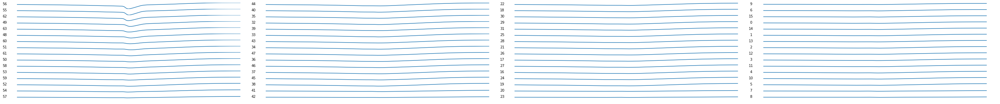

In [919]:
# plot all channels
ch_map = np.load(f"{path}channel_map.npy")
rows = np.repeat(range(4),16)
cols = np.tile(range(16),4)
ax_map = [(col, row) for (row, col) in zip(rows, cols)]

fig, ax = plt.subplots(16,4,figsize=(40,4))
for n in range(sw.mean_waveforms.shape[0]):
    ax[ax_map[n]].plot(sw.mean_waveforms[np.squeeze(ch_map[n]),:])
    ax[ax_map[n]].spines['right'].set_visible(False)
    ax[ax_map[n]].spines['left'].set_visible(False)
    ax[ax_map[n]].spines['top'].set_visible(False)
    ax[ax_map[n]].spines['bottom'].set_visible(False)
    ax[ax_map[n]].set_ylabel(np.squeeze(ch_map[n]), rotation=0)
    ax[ax_map[n]].yaxis.set_ticks([])
    ax[ax_map[n]].set_ylim(sw.mean_waveforms[:,:].min(), sw.mean_waveforms[:,:].max())
    ax[ax_map[n]].get_xaxis().set_visible(False)
fig.tight_layout(pad=0)
plt.show()

[(8, 1), (8, 0), (7, 1), (7, 0), (6, 1), (6, 0), (5, 1), (5, 0), (4, 1), (4, 0), (3, 1), (3, 0), (2, 1), (2, 0), (1, 1), (1, 0), (0, 1), (0, 0), (8, 3), (8, 2), (7, 3), (7, 2), (6, 3), (6, 2), (5, 3), (5, 2), (4, 3), (4, 2), (3, 3), (3, 2), (2, 3), (2, 2), (1, 3), (1, 2), (0, 3), (0, 2), (8, 5), (8, 4), (7, 5), (7, 4), (6, 5), (6, 4), (5, 5), (5, 4), (4, 5), (4, 4), (3, 5), (3, 4), (2, 5), (2, 4), (1, 5), (1, 4), (0, 5), (0, 4), (8, 7), (8, 6), (7, 7), (7, 6), (6, 7), (6, 6), (5, 7), (5, 6), (4, 7), (4, 6), (3, 7), (3, 6), (2, 7), (2, 6), (1, 7), (1, 6), (0, 7), (0, 6)]


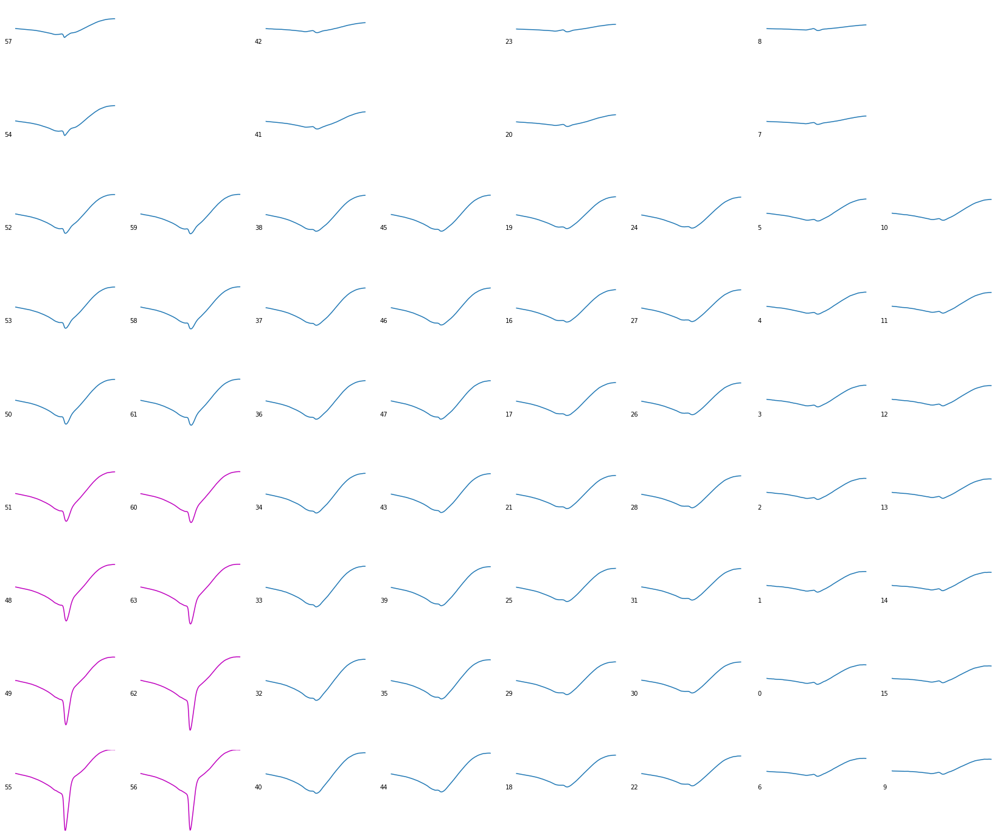

In [920]:
# plot all channels in the A4x16 configuration
# create the specific location of the sites for A4x16 probes
upper_sites = [((n+1)*16-1) for n in range(4)] + [((n+1)*16-2) for n in range(4)]
ch_map = np.load(f"{path}channel_map.npy")
rows = np.tile(np.flip(range(9)), 4)
rows = np.repeat(rows,2,axis=0)
cols = (np.repeat([[1,0],[3,2],[5,4],[7,6]],9,axis=0))
cols = cols.flatten()
ax_map = [(row, col) for (row, col) in zip(rows, cols)]
print((ax_map))

# get the n_channels channels with the highest amplitudes
n_channels = 8
amplitudes = [abs(max(sw.mean_waveforms[n,:])) + abs(min(sw.mean_waveforms[n,:])) for n in range(sw.mean_waveforms.shape[0])]
channel_amp_list = [(c,a) for c,a in zip(amplitudes, range(sw.mean_waveforms.shape[0]))]
channel_amp_dict = dict(channel_amp_list)
amp_sorted_channels = [channel_amp_dict[a] for a in sorted(channel_amp_dict)]
channels = amp_sorted_channels[:(sw.mean_waveforms.shape[0]-n_channels-1):-1]

# plot the wave forms
fig = plt.figure(figsize=(25,25), constrained_layout=False)
layout = fig.add_gridspec(nrows=9, ncols=8, left=0.05, right=0.95, wspace=0.15, hspace=0.15)
n_ax = 0
for n in range(sw.mean_waveforms.shape[0]):
    if n in upper_sites:
        ax = fig.add_subplot(layout[ax_map[n_ax][0],(ax_map[n_ax][1]-1):(ax_map[n_ax][1])])
        n_ax += 2
    else:
        ax = fig.add_subplot(layout[ax_map[n_ax]])
        n_ax += 1
    if ch_map[n] in channels:
        ax.plot(sw.mean_waveforms[np.squeeze(ch_map[n]),:], 'm')
    else:
        ax.plot(sw.mean_waveforms[np.squeeze(ch_map[n]),:])    
    ax.spines['right'].set_visible(False)
    ax.spines['left'].set_visible(False)
    ax.spines['top'].set_visible(False)
    ax.spines['bottom'].set_visible(False)
    ax.set_ylabel(np.squeeze(ch_map[n]), rotation=0)
    ax.yaxis.set_ticks([])
    ax.set_ylim(sw.mean_waveforms[:,:].min(), sw.mean_waveforms[:,:].max())
    ax.get_xaxis().set_visible(False)

Time in animal pose: 1219.89595 sec
Time in animal pose: 1262.66395 sec
Time in animal pose: 1251.9719500000006 sec


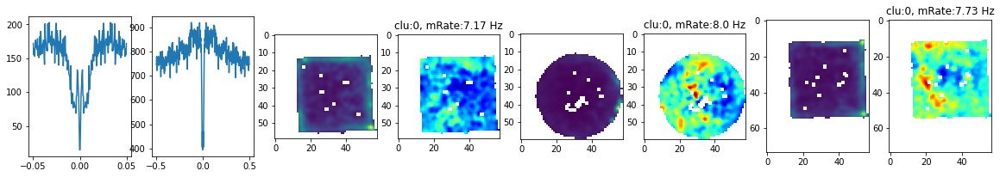

In [921]:
n = cg.neuron_list[0]
fig, axs = plt.subplots(1,8,figsize=(20,3))

n.spike_train.spike_time_autocorrelation(bin_size_sec=0.0005,min_sec=-0.05, max_sec=0.05)
timestamp = n.spike_train.mid_point_from_edges(n.spike_train.st_autocorrelation_histogram[1])
axs[0].plot(timestamp, n.spike_train.st_autocorrelation_histogram[0])
    
n.spike_train.spike_time_autocorrelation(bin_size_sec=0.0025,min_sec=-0.5, max_sec=0.5)
timestamp = n.spike_train.mid_point_from_edges(n.spike_train.st_autocorrelation_histogram[1])
axs[1].plot(timestamp, n.spike_train.st_autocorrelation_histogram[0])



n.spike_train.unset_intervals()
ap.unset_intervals()
n.spike_train.set_intervals(first_sqr70_inter)
ap.set_intervals(first_sqr70_inter)
print("Time in animal pose: {} sec".format(ap.intervals.total_interval_duration_seconds()))
n.set_spatial_properties(ap)
ap.occupancy_map_2d()
axs[2].imshow(ap.occupancy_map)
n.spatial_properties.firing_rate_map_2d(cm_per_bin =2, smoothing_sigma_cm = 2, smoothing=True)
im = axs[3].imshow(n.spatial_properties.firing_rate_map,cmap='jet')
axs[3].set_title("clu:{}, mRate:{:.3} Hz".format(n.name,n.spike_train.mean_firing_rate()))


n.spike_train.unset_intervals()
ap.unset_intervals()
n.spike_train.set_intervals(first_circ80_inter)
ap.set_intervals(first_circ80_inter)
print("Time in animal pose: {} sec".format(ap.intervals.total_interval_duration_seconds()))
ap.occupancy_map_2d()
axs[4].imshow(ap.occupancy_map)
n.spatial_properties.firing_rate_map_2d(cm_per_bin =2, smoothing_sigma_cm = 2, smoothing=True)
im = axs[5].imshow(n.spatial_properties.firing_rate_map,cmap='jet')
axs[5].set_title("clu:{}, mRate:{:.3} Hz".format(n.name,n.spike_train.mean_firing_rate()))


n.spike_train.unset_intervals()
ap.unset_intervals()
n.spike_train.set_intervals(last_sqr70_inter)
ap.set_intervals(last_sqr70_inter)
print("Time in animal pose: {} sec".format(ap.intervals.total_interval_duration_seconds()))
ap.occupancy_map_2d()
axs[6].imshow(ap.occupancy_map)
n.spatial_properties.firing_rate_map_2d(cm_per_bin =2, smoothing_sigma_cm = 2, smoothing=True)
im = axs[7].imshow(n.spatial_properties.firing_rate_map,cmap='jet')
axs[7].set_title("clu:{}, mRate:{:.3} Hz".format(n.name,n.spike_train.mean_firing_rate()))


plt.show()

Plot the instaneous firing rate of a neuron over the whole session.

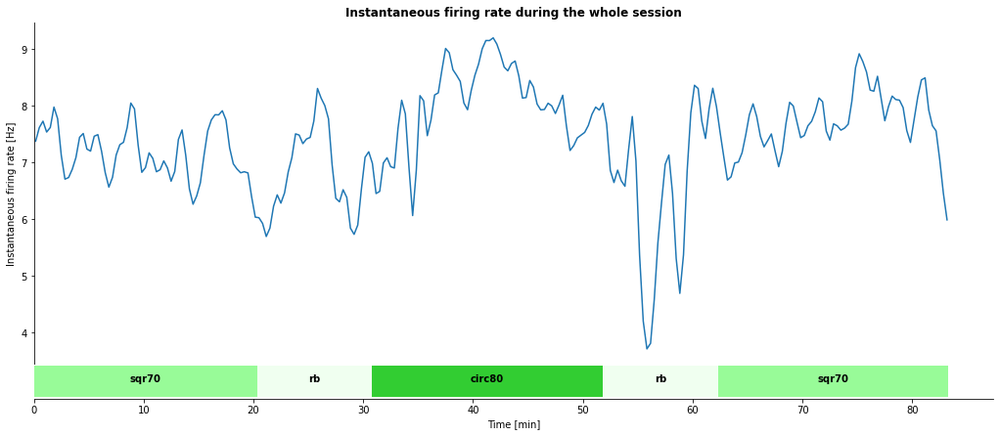

In [922]:
## use Spike train object
#st = Spike_train(st=stl.spike_times[0])
#st.set_spike_train(st=stl.spike_times[0])
#st.instantaneous_firing_rate(bin_size_ms=20000)
#n.spike_train.unset_intervals()

## alternatively, use cell group object
n = cg.neuron_list[0]
n.spike_train.unset_intervals()
n.spike_train.instantaneous_firing_rate(bin_size_ms=20000)
# take average of consecutive values and convert from ms to min
timepoints = 0.5*(n.spike_train.ifr[2][1:] + n.spike_train.ifr[2][:-1])/1000/60

# for stacked bar chart with environments
trial_intervals = (ses.trial_intervals.inter[n[0]][-1] for n in enumerate(ses.trial_intervals.inter))
trial_duration = [x/60 for x in trial_intervals] # convert to min
trial_duration.insert(0,0)
trial_duration = [trial_duration[n+1] - trial_duration[n] for n in (range(len(trial_duration)-1))]
colors = ['palegreen', 'honeydew', 'limegreen', 'honeydew', 'palegreen']
labels = ses.desen # figure and axis

fig, ax = plt.subplots(2,1, figsize=(14, 6), sharex=True, gridspec_kw={'height_ratios': [10, 1]})

ax[0].plot(timepoints, n.spike_train.ifr[0])

left = 0
for trial,intervals in enumerate(trial_duration):
    ax[1].barh(0, intervals, left = left, color=colors[trial]) #plot environments as stacked bar
    ax[1].text((intervals*0.5 + left), 0, labels[trial], ha='center', weight = 'bold') # label environments
    left = left + intervals
    
ax[0].set_title("Instantaneous firing rate during the whole session", weight = 'bold')
ax[0].set_ylabel("Instantaneous firing rate [Hz]")
ax[1].set_xlabel("Time [min]")
ax[0].spines['right'].set_visible(False); ax[1].spines['right'].set_visible(False)
ax[1].spines['left'].set_visible(False)
ax[0].spines['top'].set_visible(False); ax[1].spines['top'].set_visible(False)
ax[0].spines['bottom'].set_visible(False)
ax[1].set_axisbelow(True)
ax[1].get_yaxis().set_visible(False)
ax[1].get_xaxis()
fig.tight_layout(pad=0)
plt.show()

Create a summary file containing the spike time autocorrelograms, the firing rate maps, the HD plots, the instantaneous firing rate over trials and the waveforms. Cave: this takes about half a minute per cell!

  0%|                                                    | 0/36 [00:00<?, ?it/s]

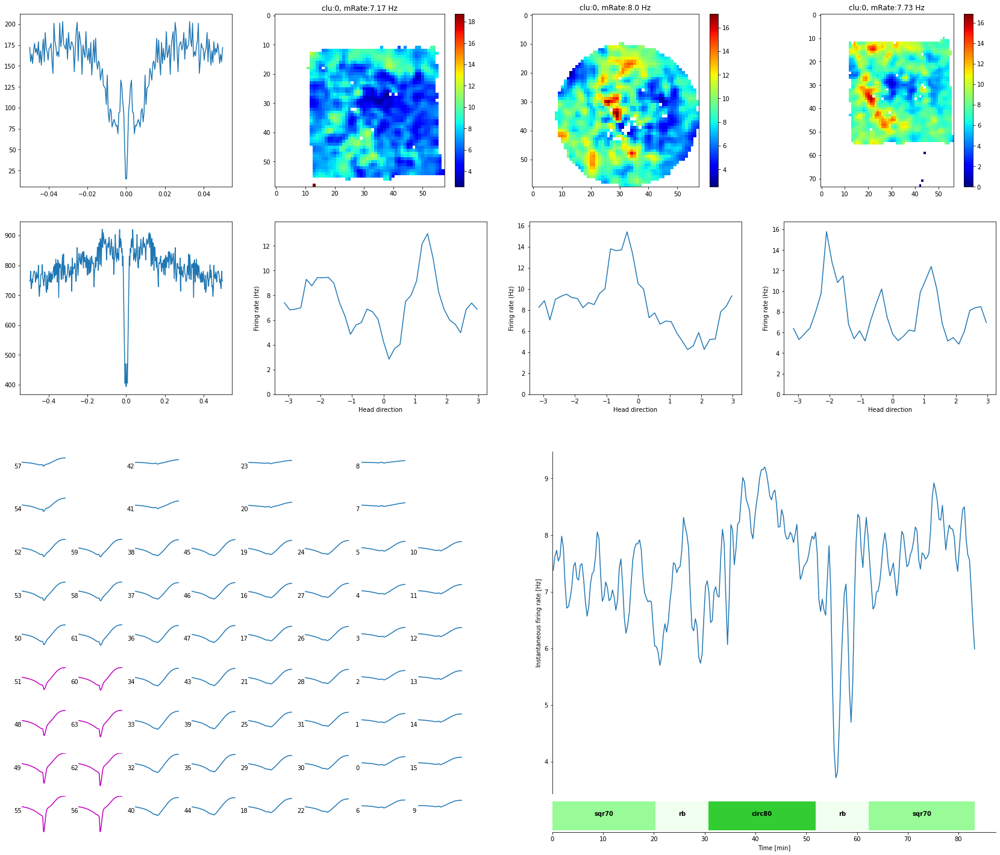

  3%|█▏                                          | 1/36 [01:00<35:22, 60.65s/it]

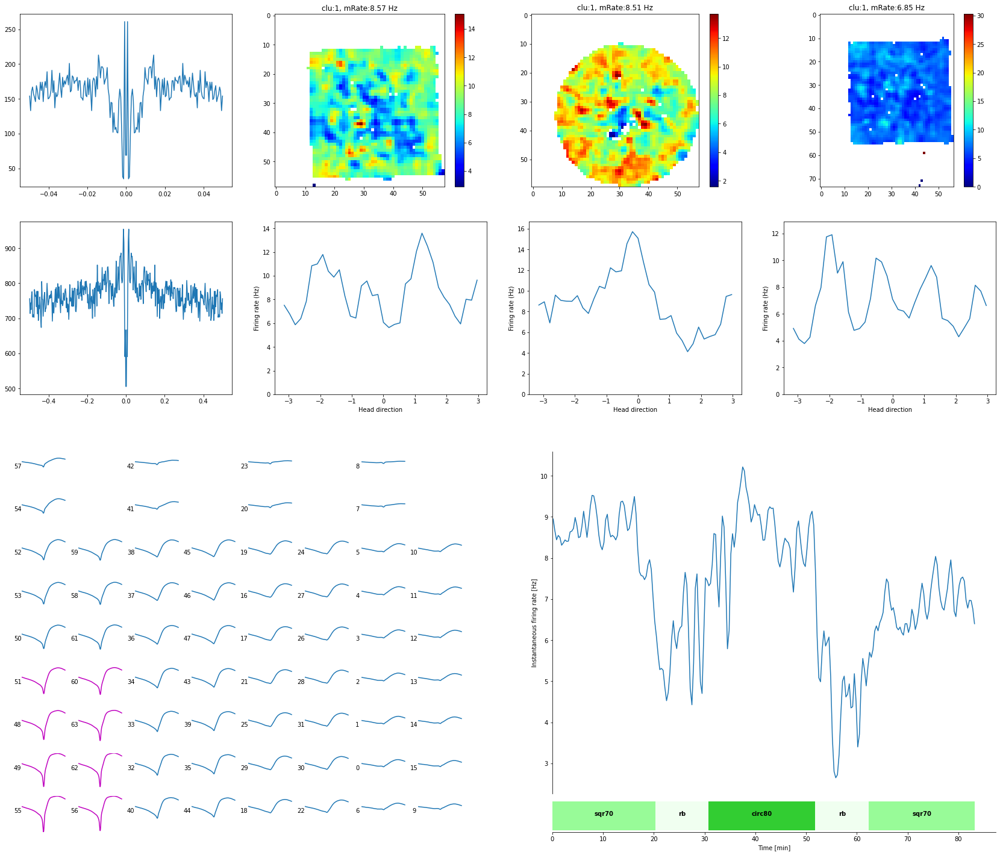

  6%|██▍                                         | 2/36 [01:59<33:51, 59.75s/it]

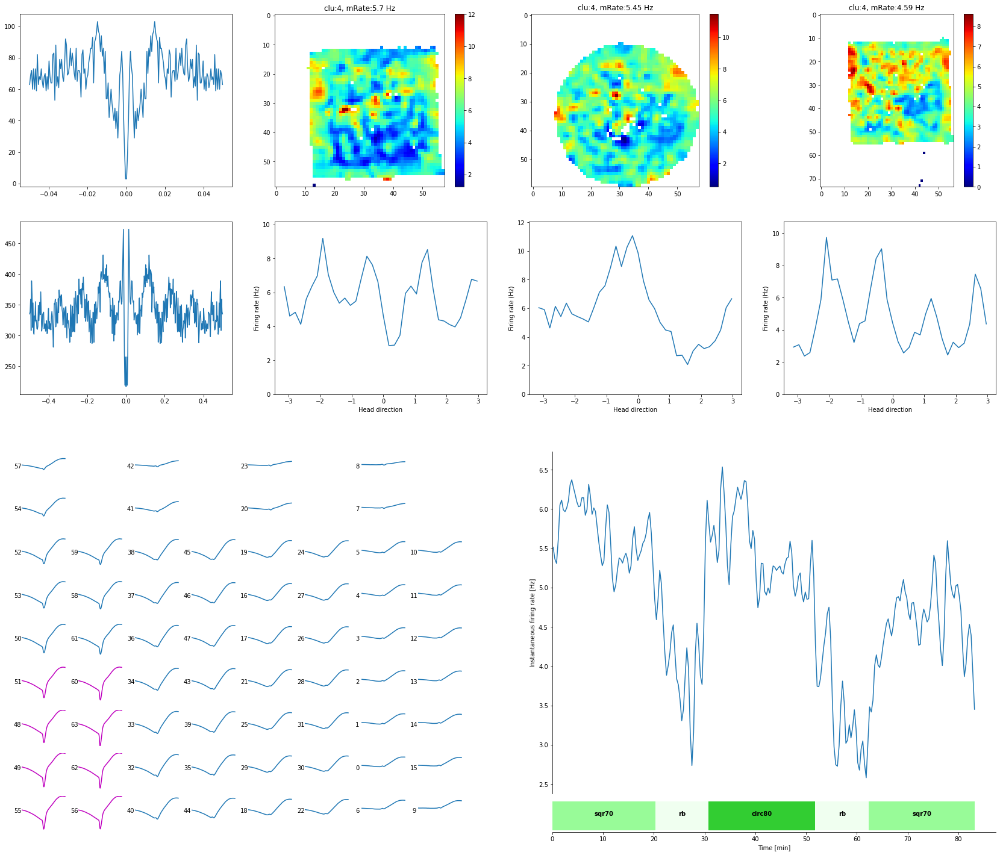

  8%|███▋                                        | 3/36 [02:49<30:25, 55.31s/it]

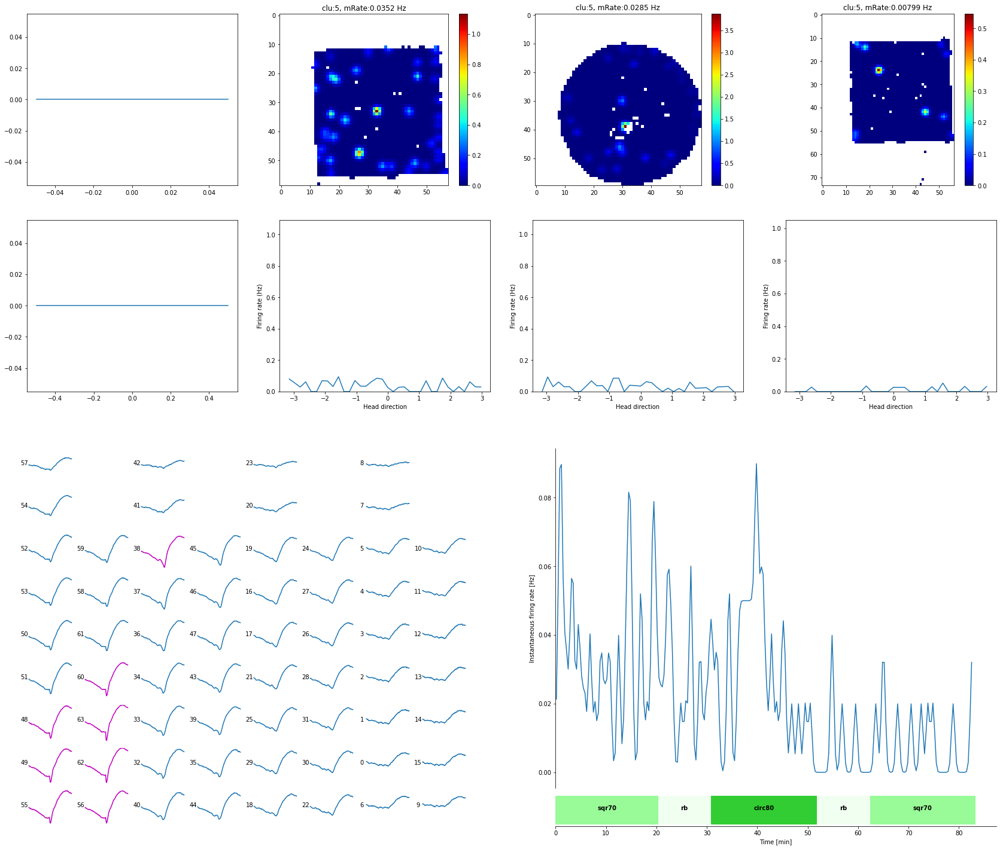

 11%|████▉                                       | 4/36 [02:52<18:22, 34.45s/it]

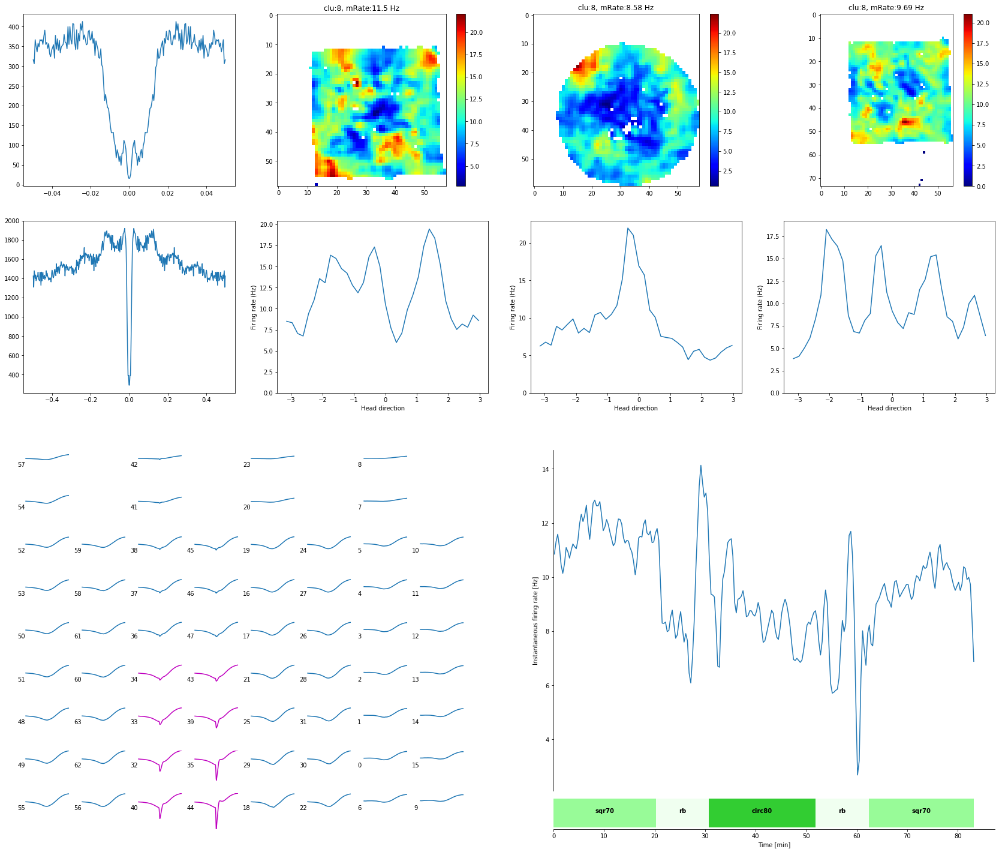

 14%|██████                                      | 5/36 [03:46<21:31, 41.67s/it]

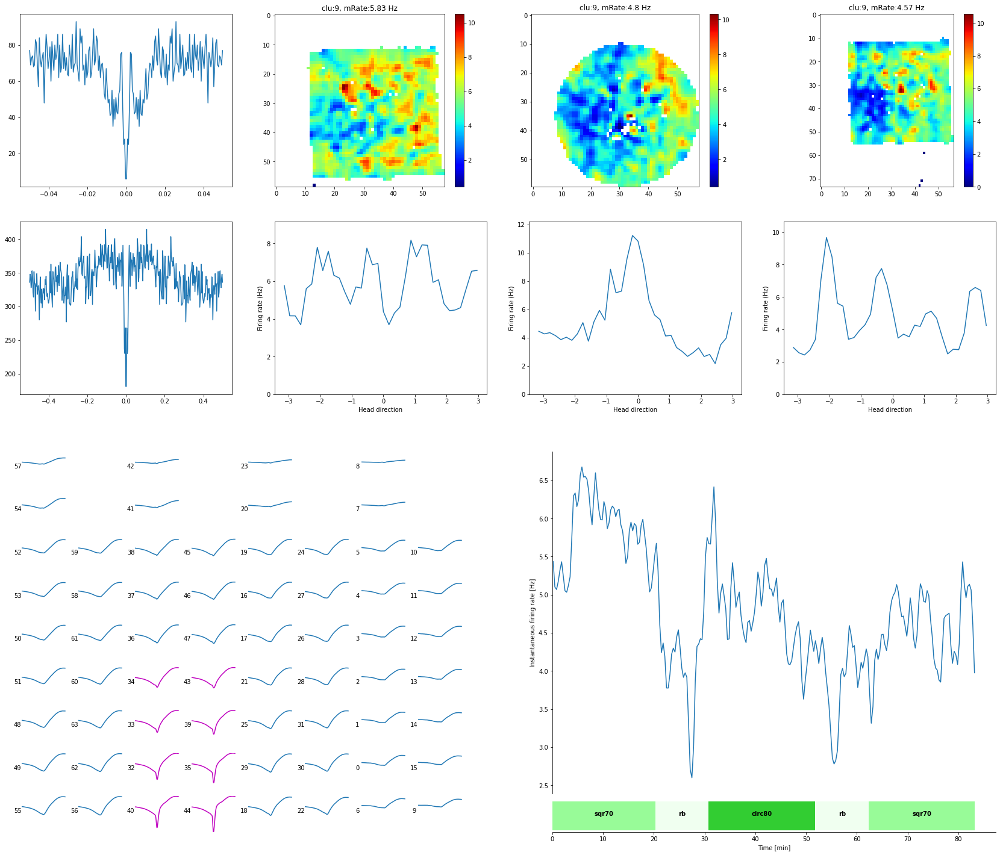

 17%|███████▎                                    | 6/36 [04:28<20:55, 41.84s/it]

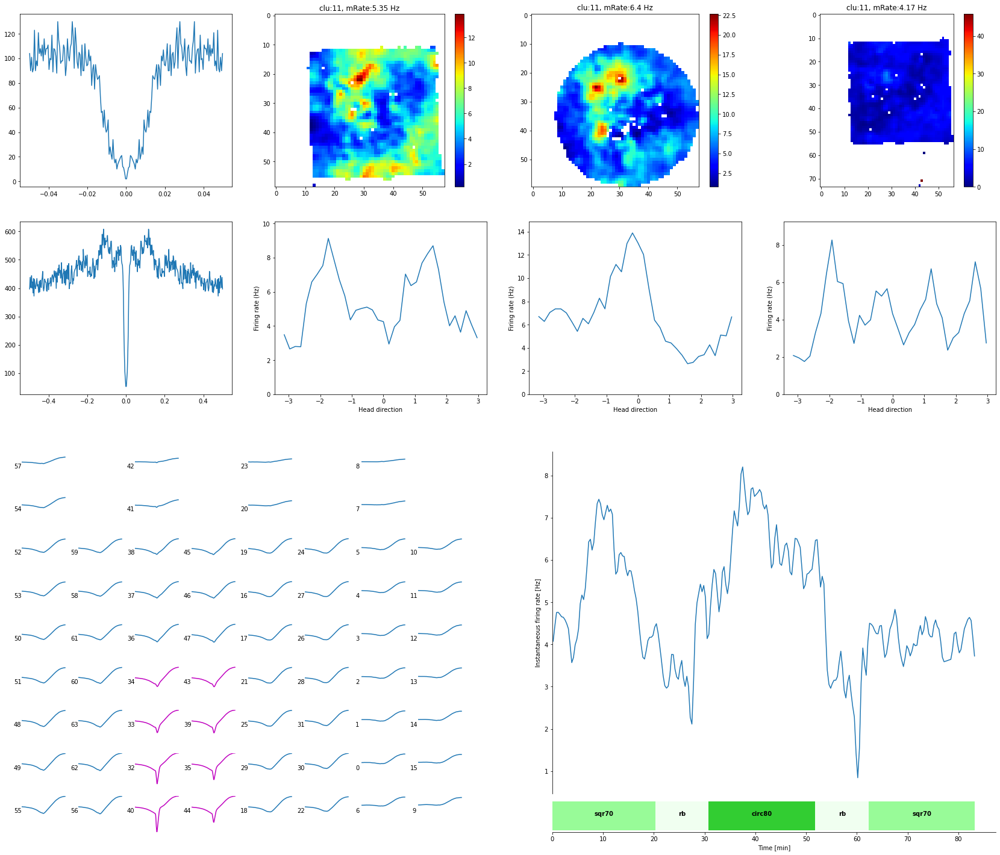

 19%|████████▌                                   | 7/36 [05:05<19:19, 39.99s/it]

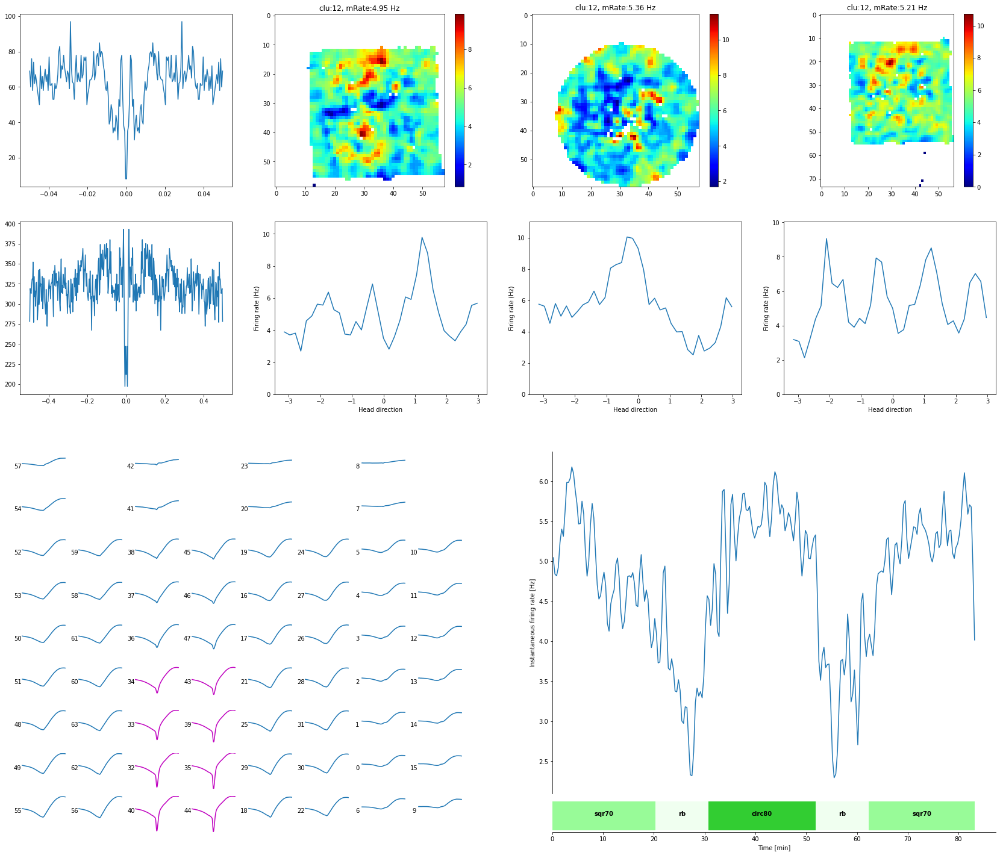

 22%|█████████▊                                  | 8/36 [05:58<20:42, 44.36s/it]

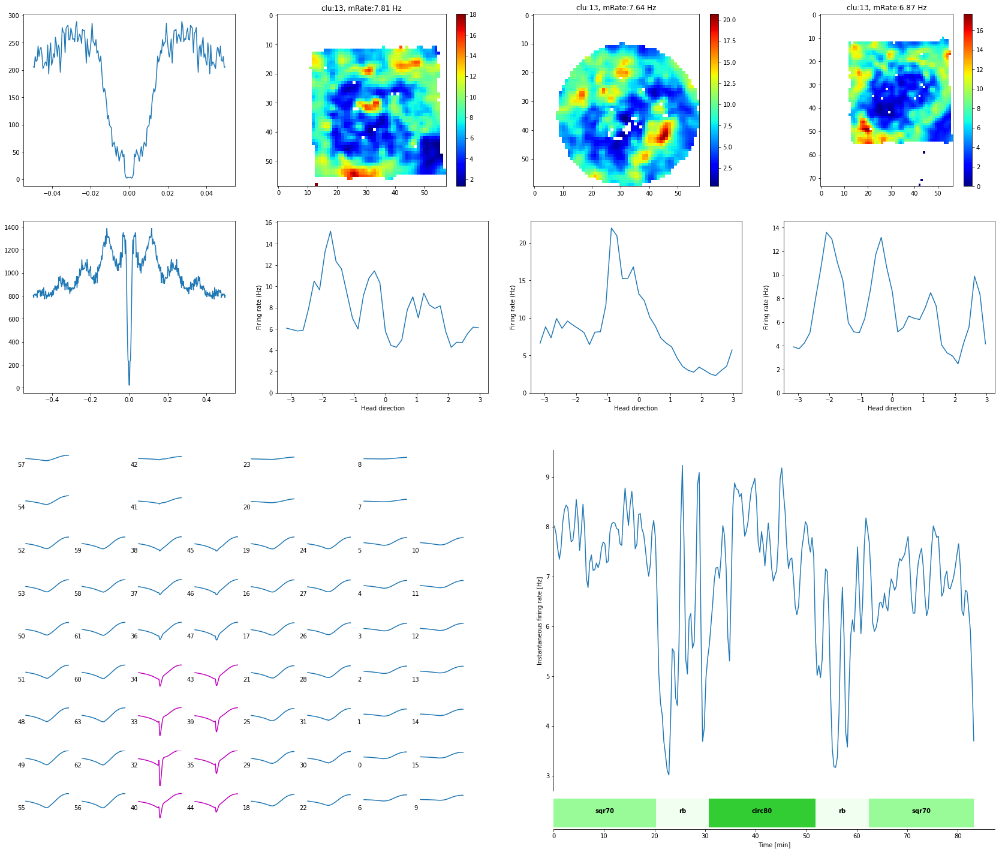

 25%|███████████                                 | 9/36 [06:47<20:37, 45.85s/it]

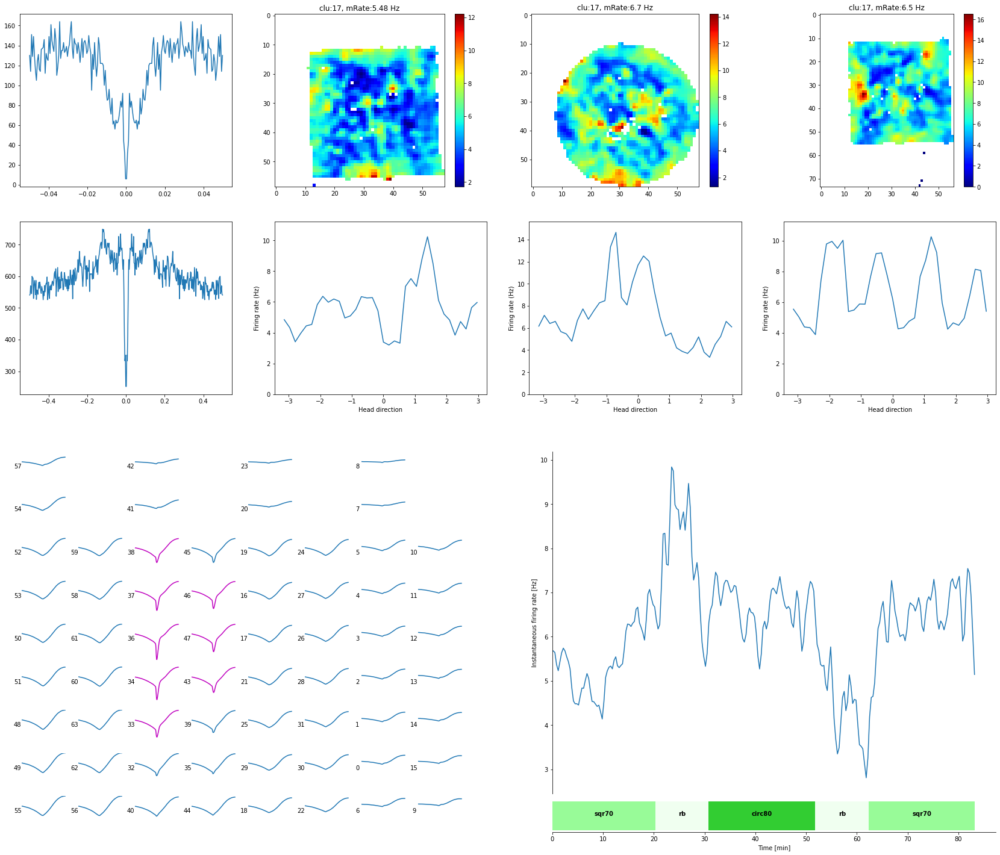

 28%|███████████▉                               | 10/36 [07:35<20:05, 46.38s/it]

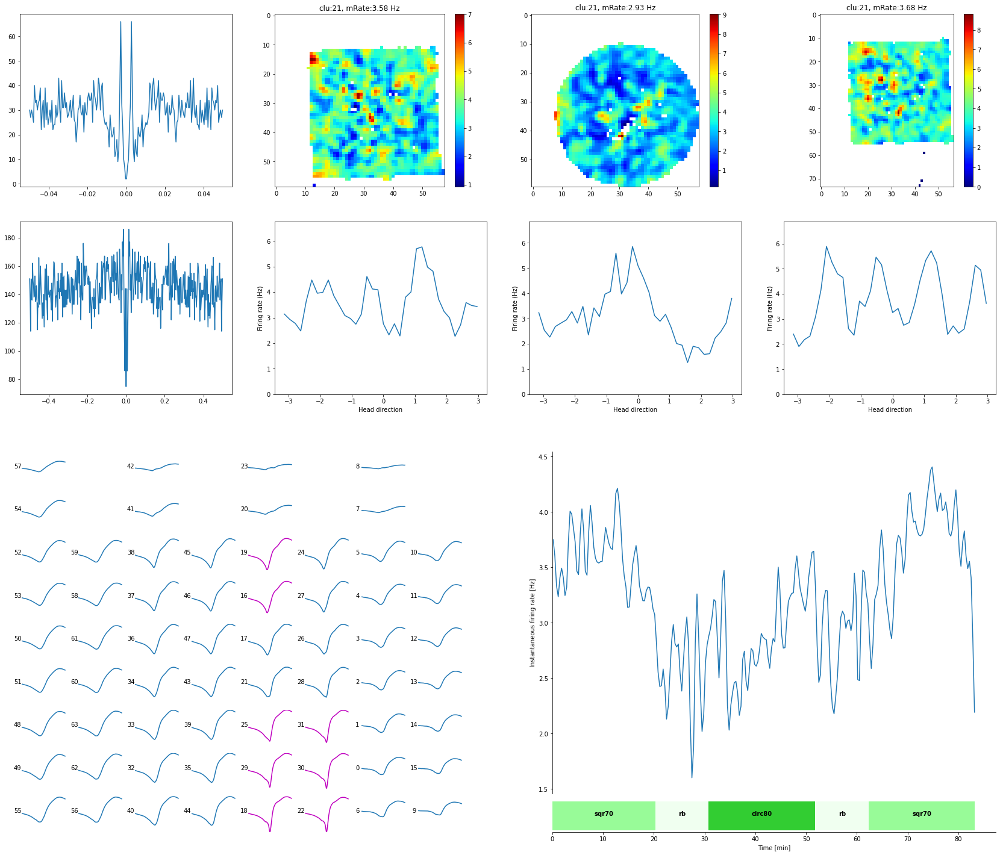

 31%|█████████████▏                             | 11/36 [08:04<17:09, 41.19s/it]

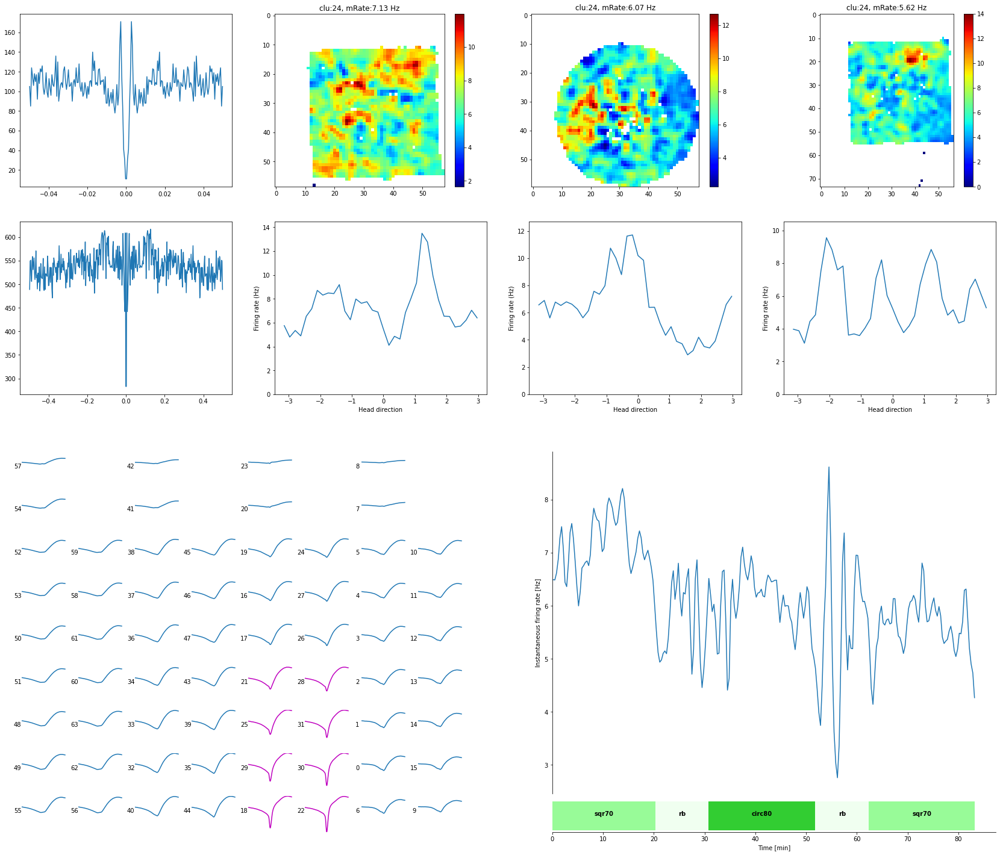

 33%|██████████████▎                            | 12/36 [08:51<17:10, 42.95s/it]

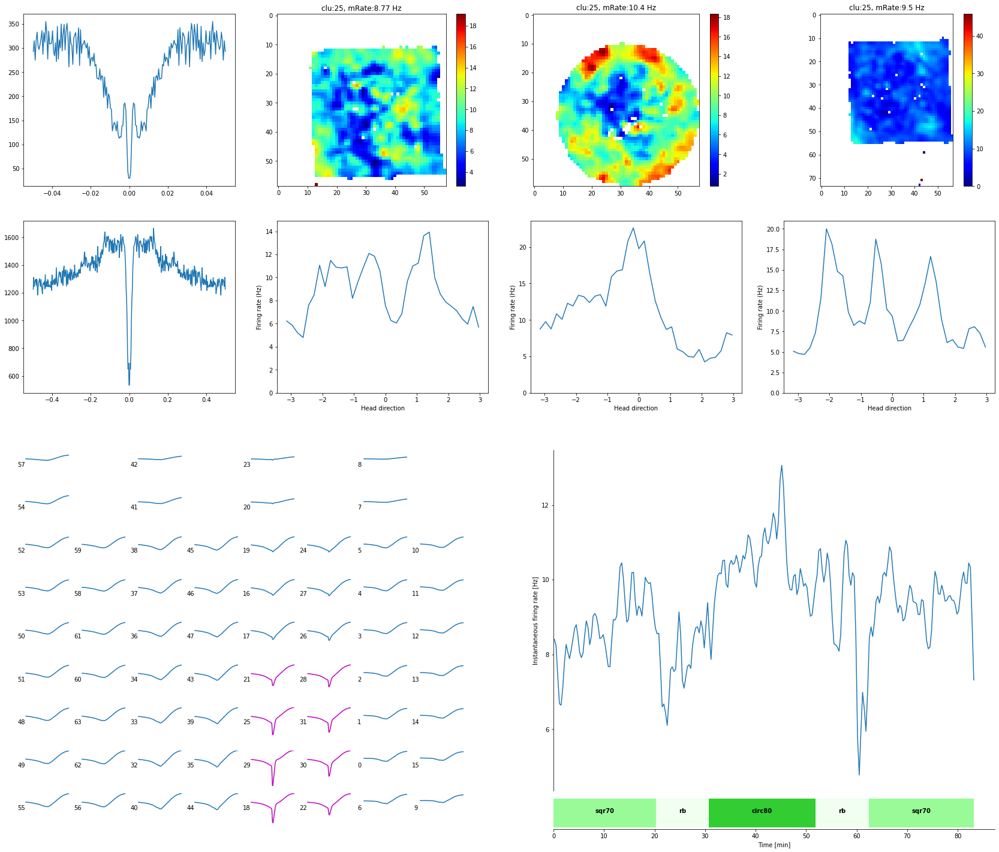

 36%|███████████████▌                           | 13/36 [09:53<18:34, 48.47s/it]

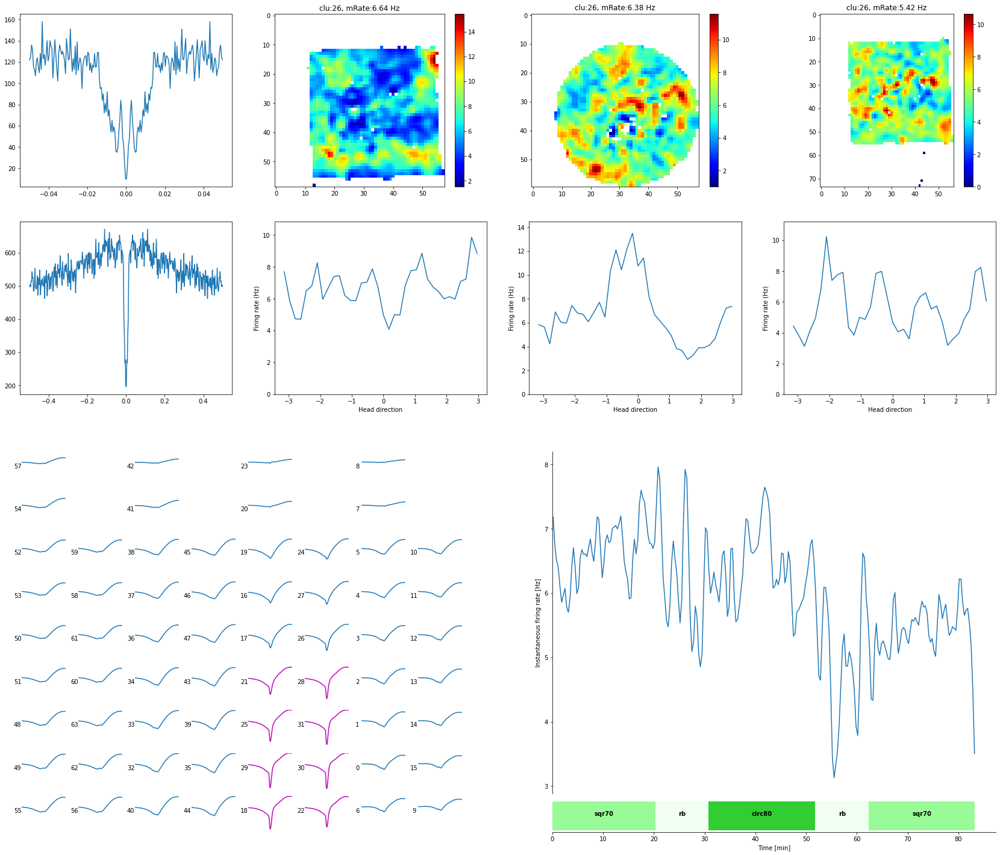

 39%|████████████████▋                          | 14/36 [10:49<18:39, 50.89s/it]

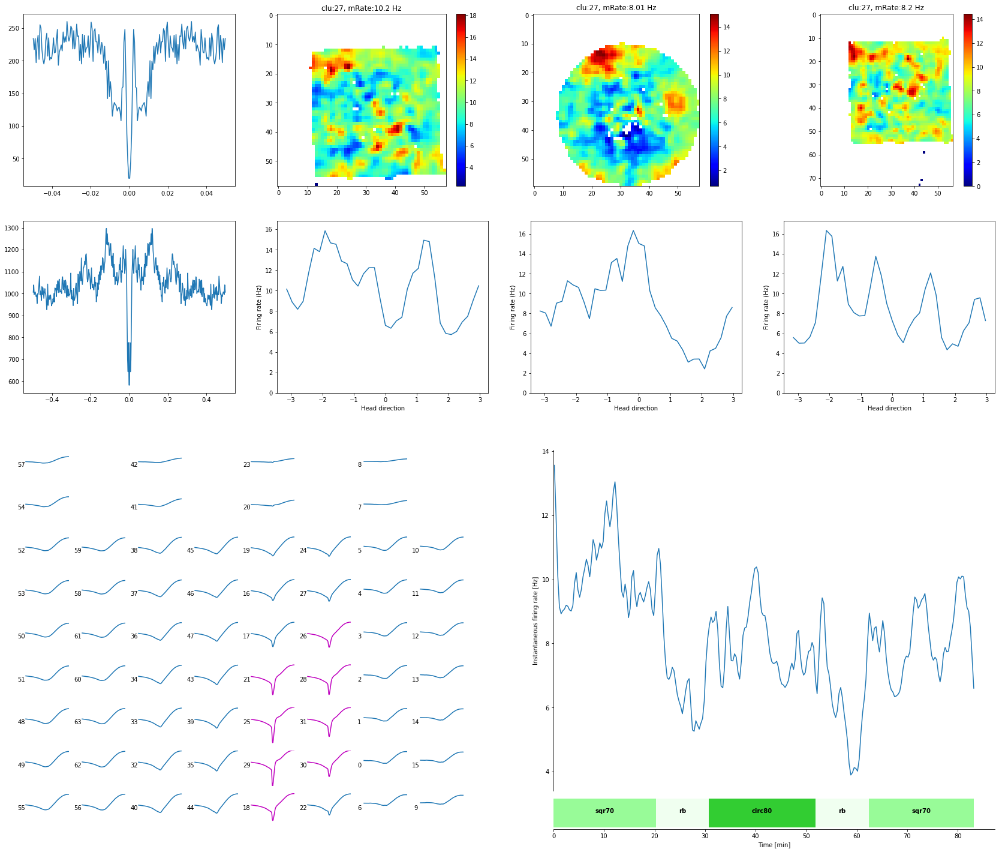

 42%|█████████████████▉                         | 15/36 [11:51<19:00, 54.33s/it]

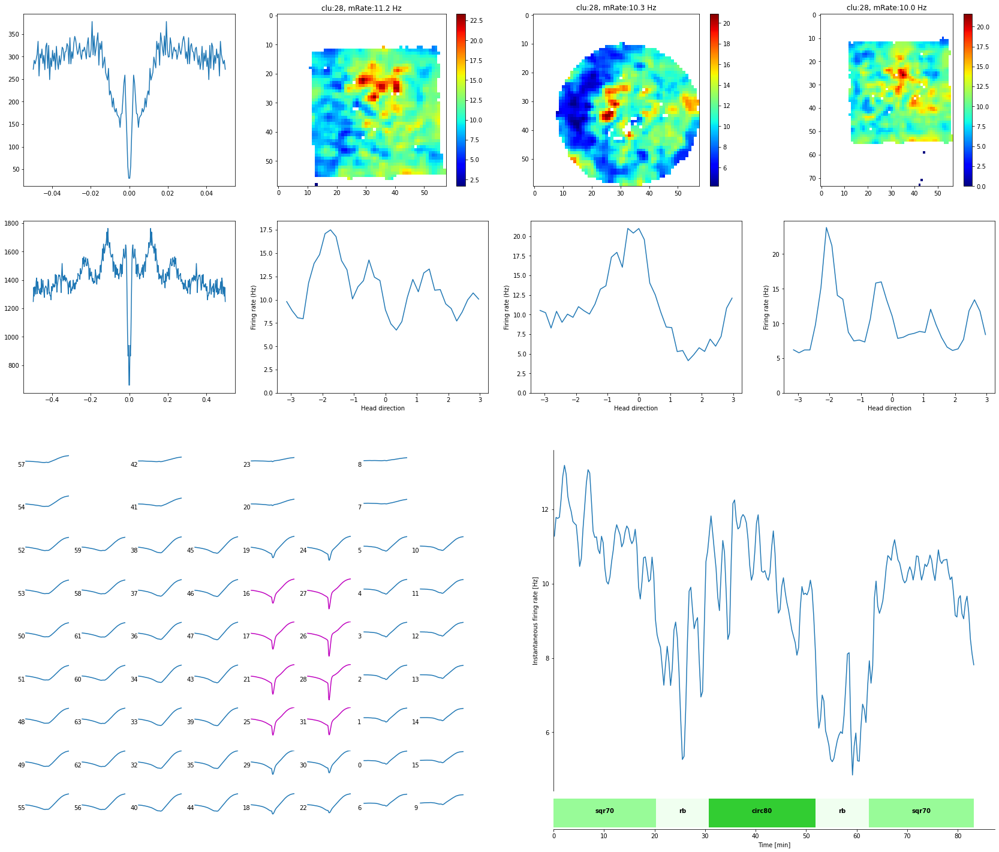

 44%|███████████████████                        | 16/36 [12:54<18:54, 56.73s/it]

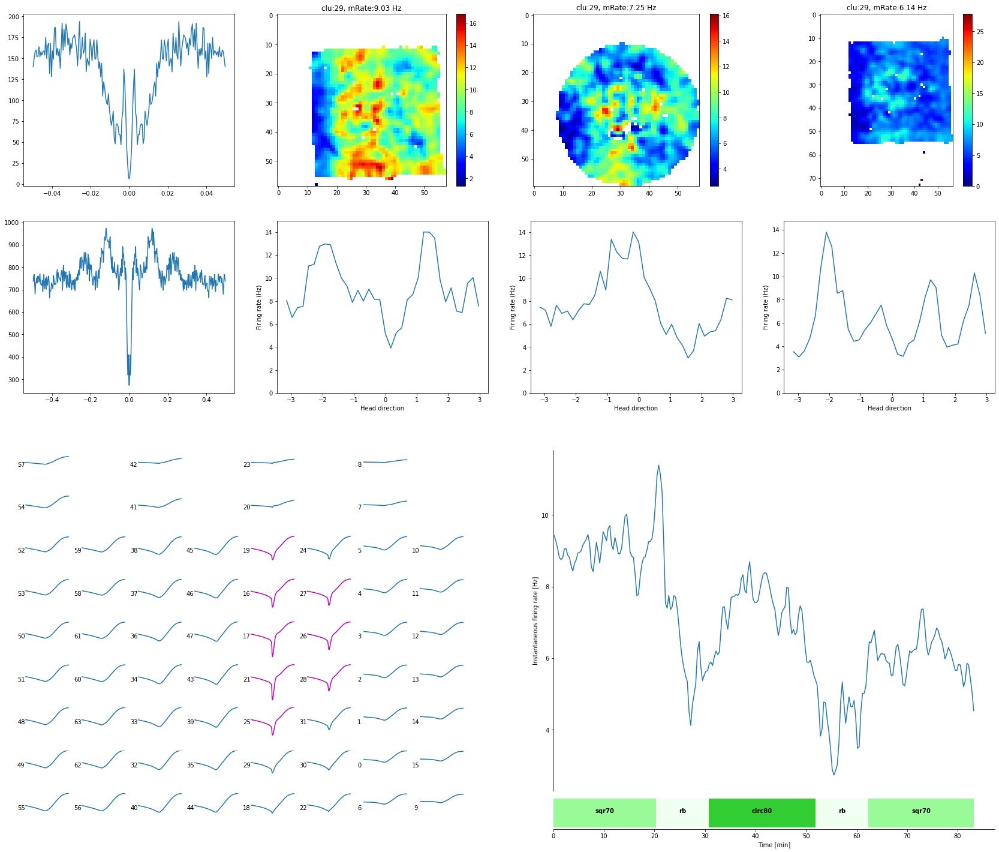

 47%|████████████████████▎                      | 17/36 [13:47<17:40, 55.84s/it]

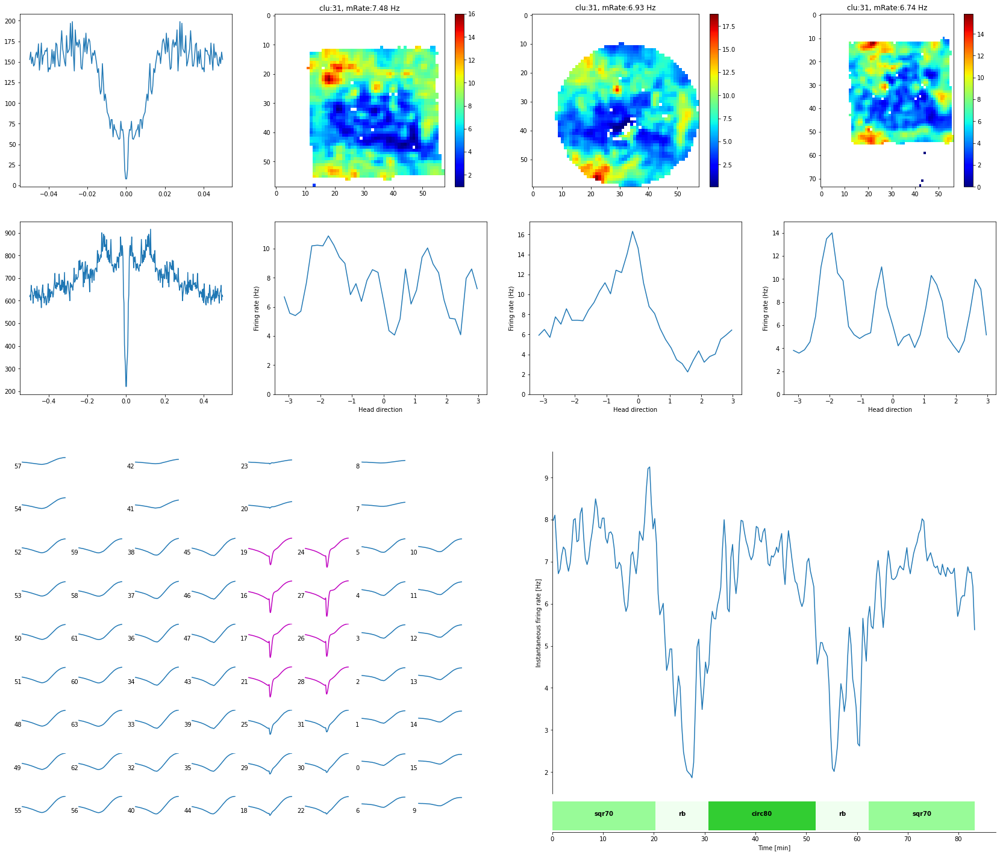

 50%|█████████████████████▌                     | 18/36 [14:33<15:47, 52.65s/it]

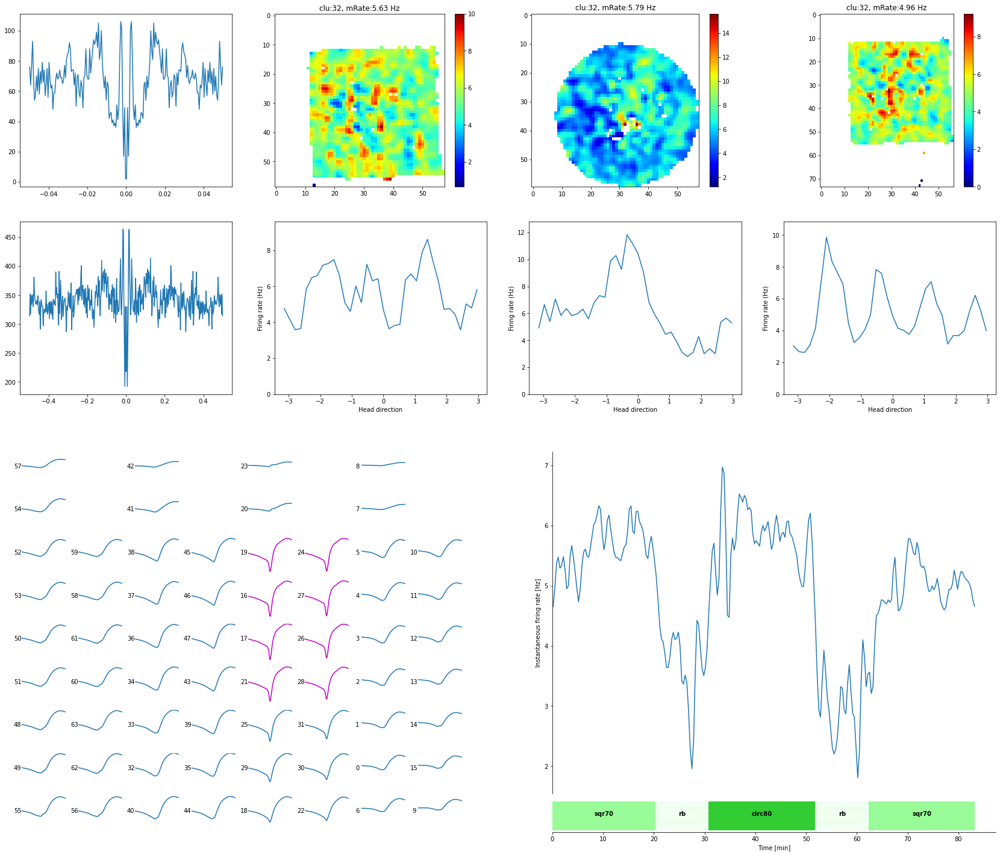

 53%|██████████████████████▋                    | 19/36 [15:12<13:48, 48.75s/it]

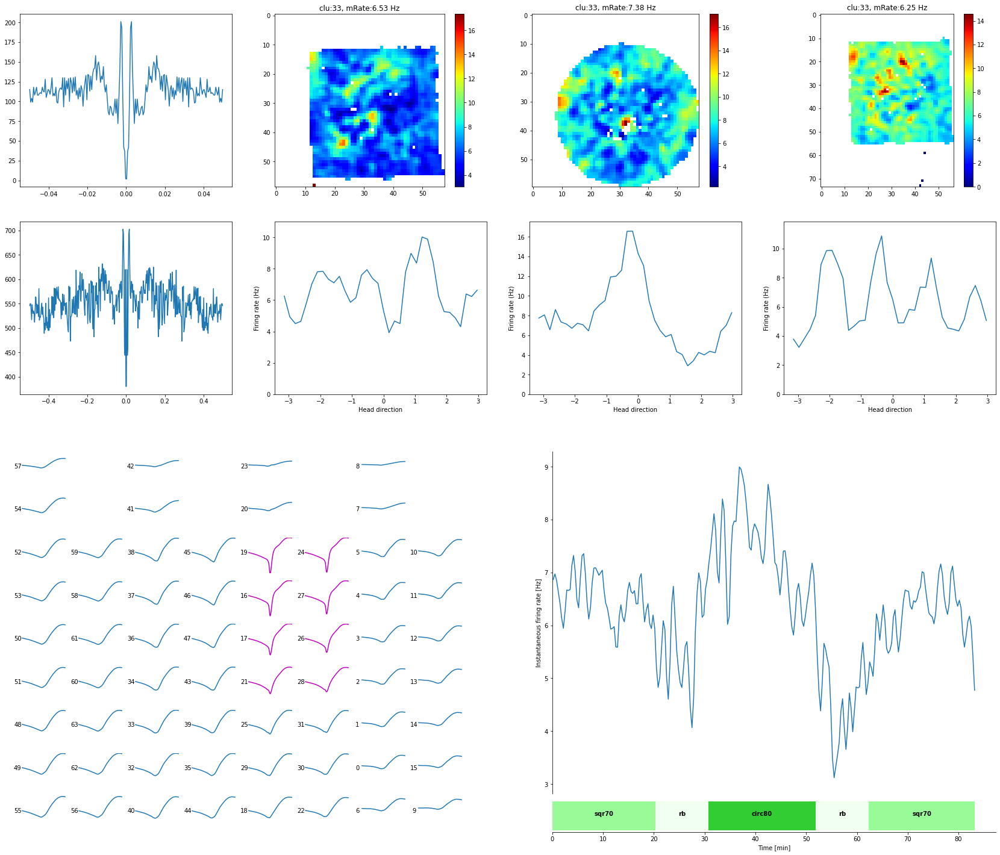

 56%|███████████████████████▉                   | 20/36 [16:00<12:52, 48.30s/it]

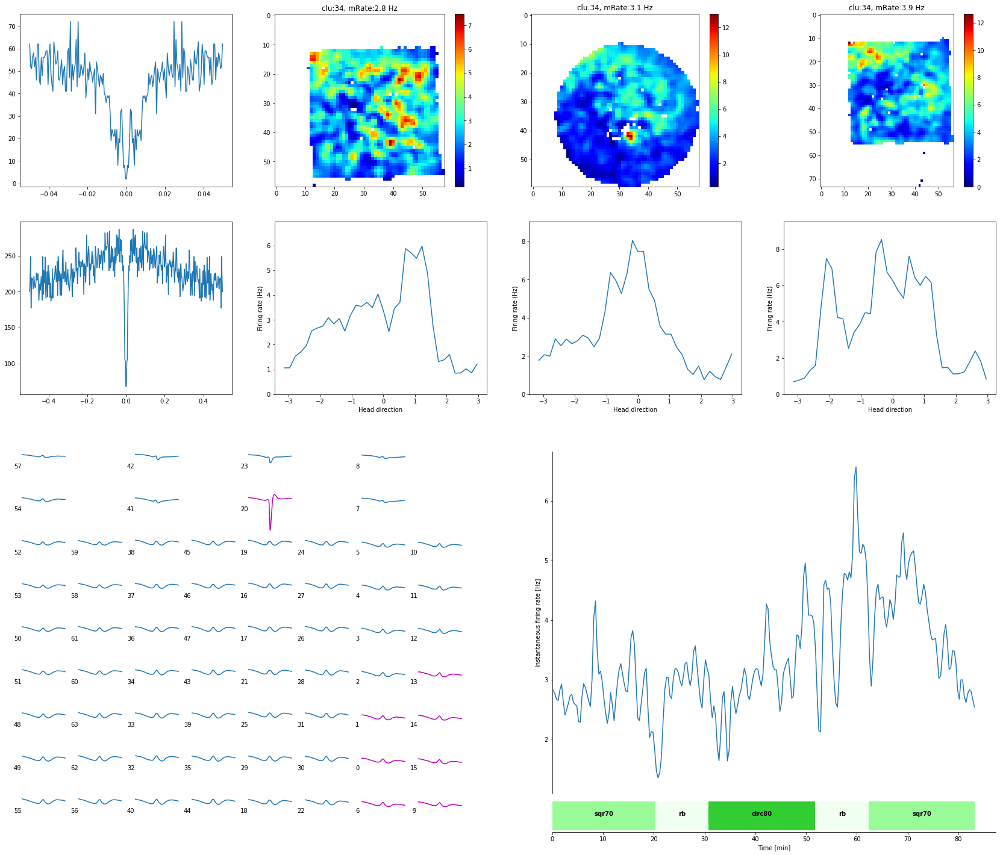

 58%|█████████████████████████                  | 21/36 [16:29<10:37, 42.52s/it]

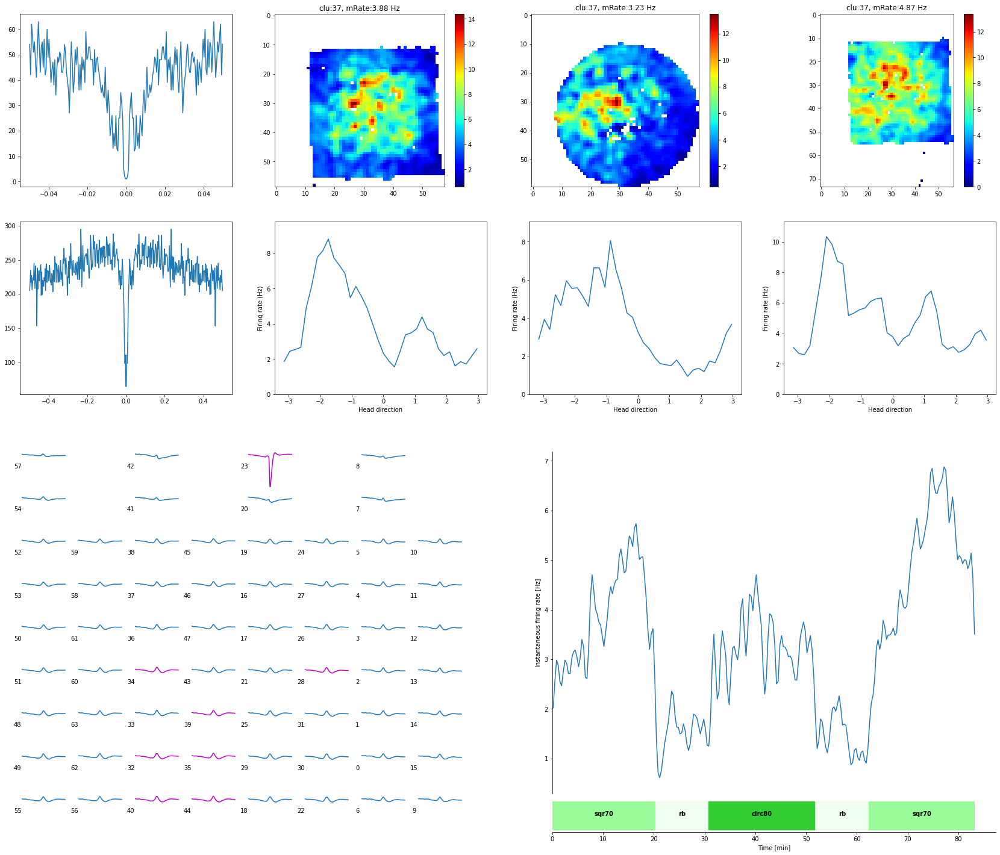

 61%|██████████████████████████▎                | 22/36 [16:57<08:54, 38.18s/it]

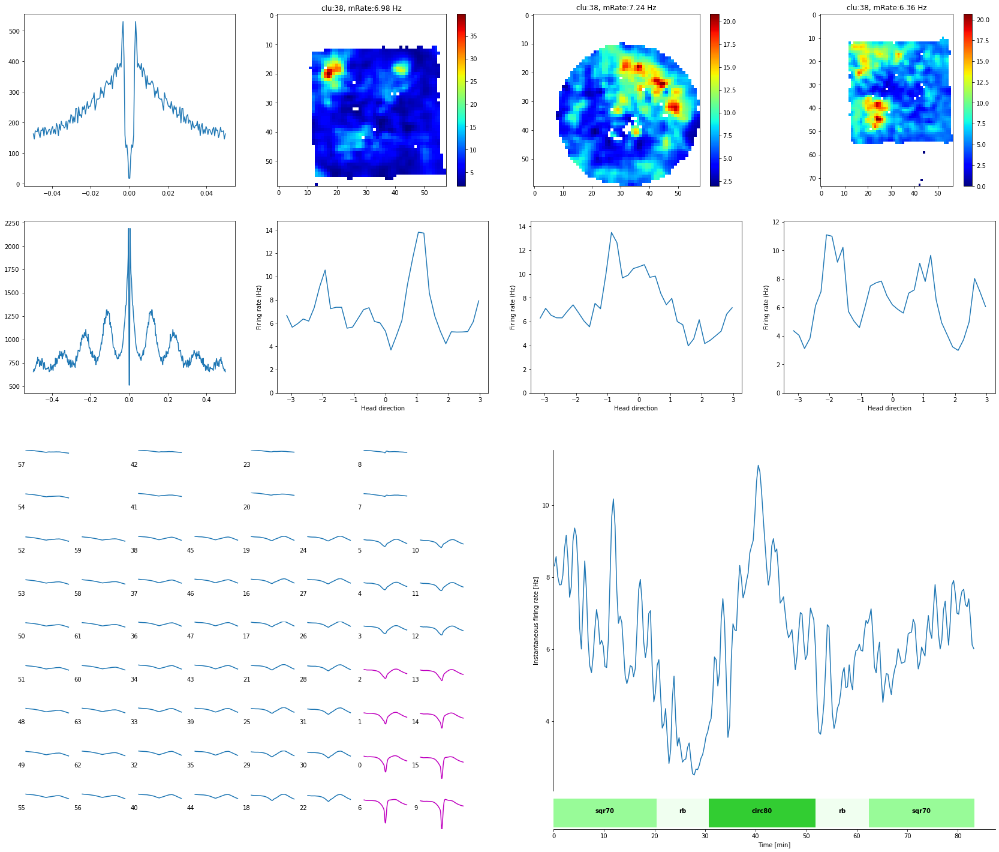

 64%|███████████████████████████▍               | 23/36 [17:44<08:53, 41.06s/it]

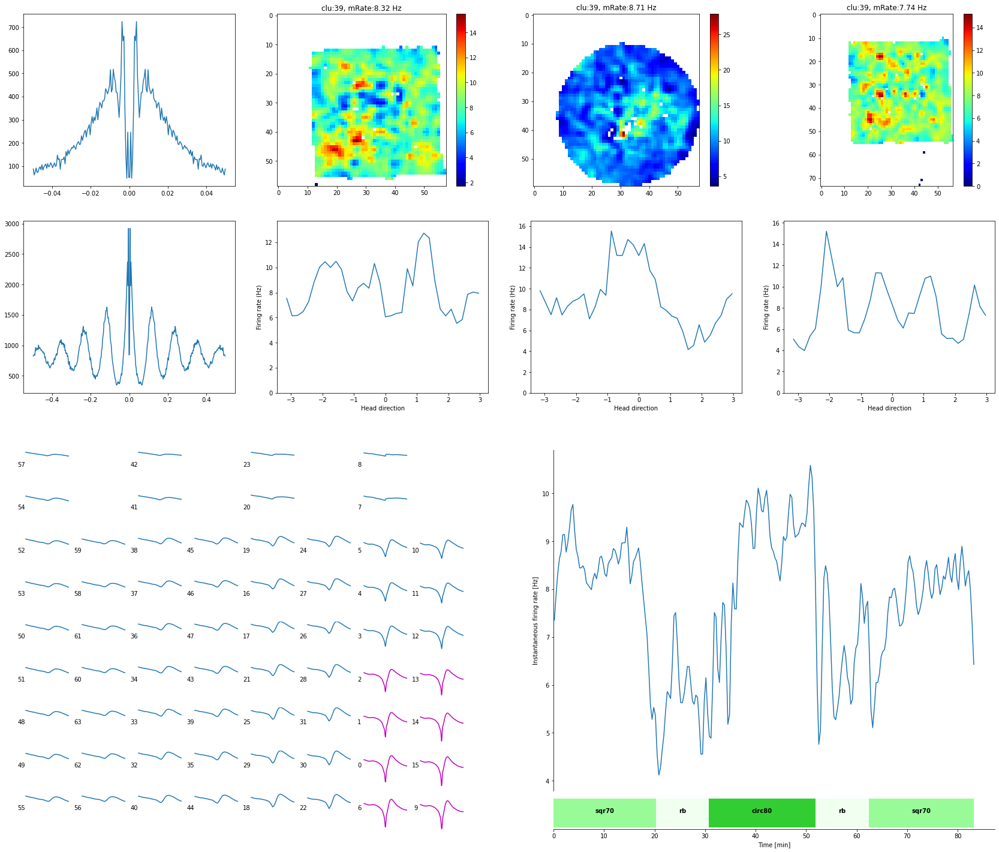

 67%|████████████████████████████▋              | 24/36 [18:48<09:34, 47.86s/it]

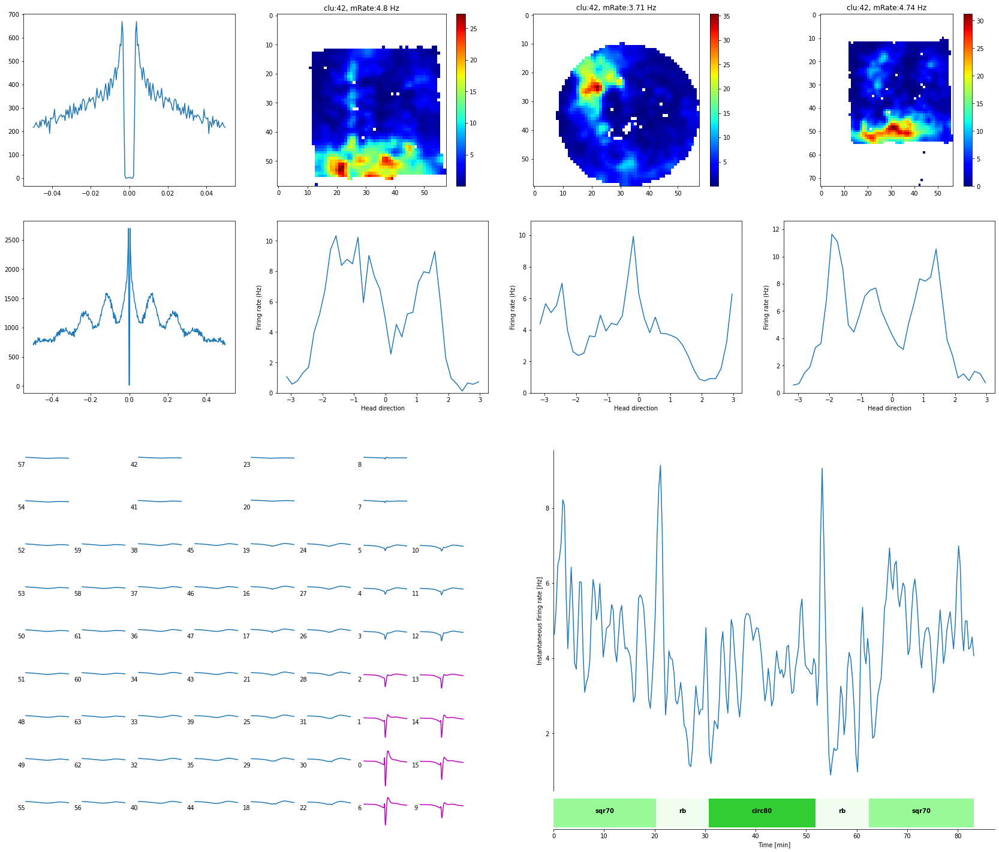

 69%|█████████████████████████████▊             | 25/36 [19:12<07:28, 40.78s/it]

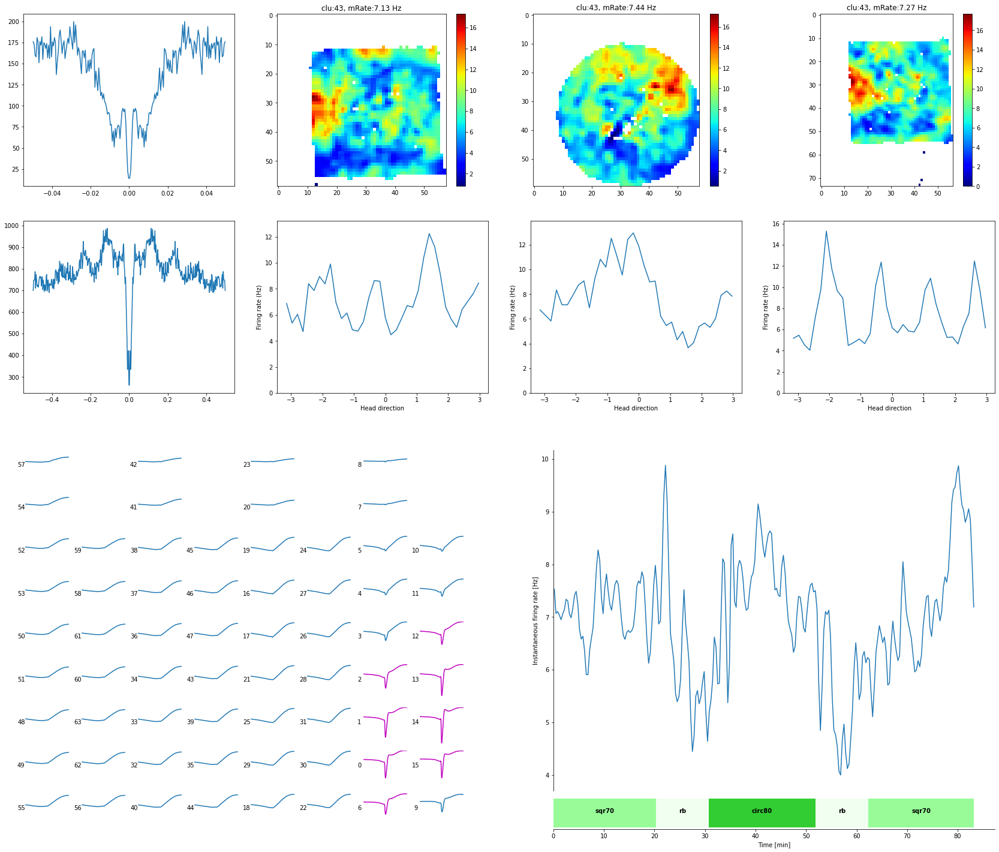

 72%|███████████████████████████████            | 26/36 [20:26<08:24, 50.49s/it]

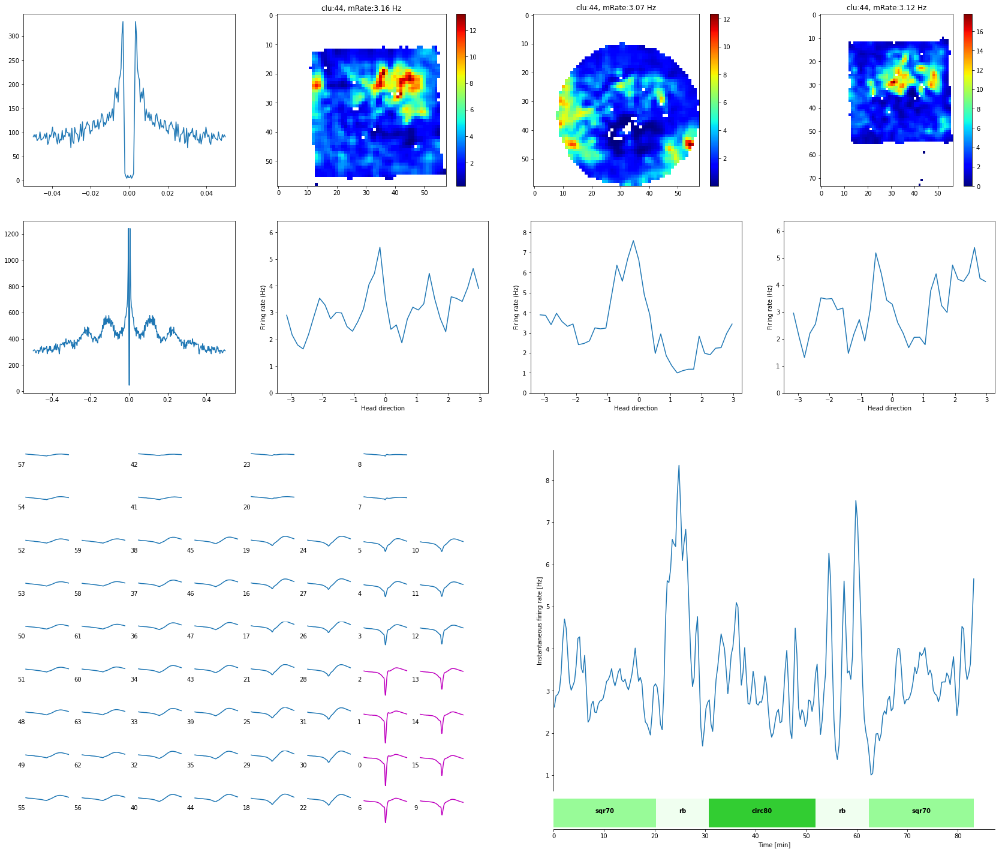

 75%|████████████████████████████████▎          | 27/36 [21:52<09:11, 61.33s/it]

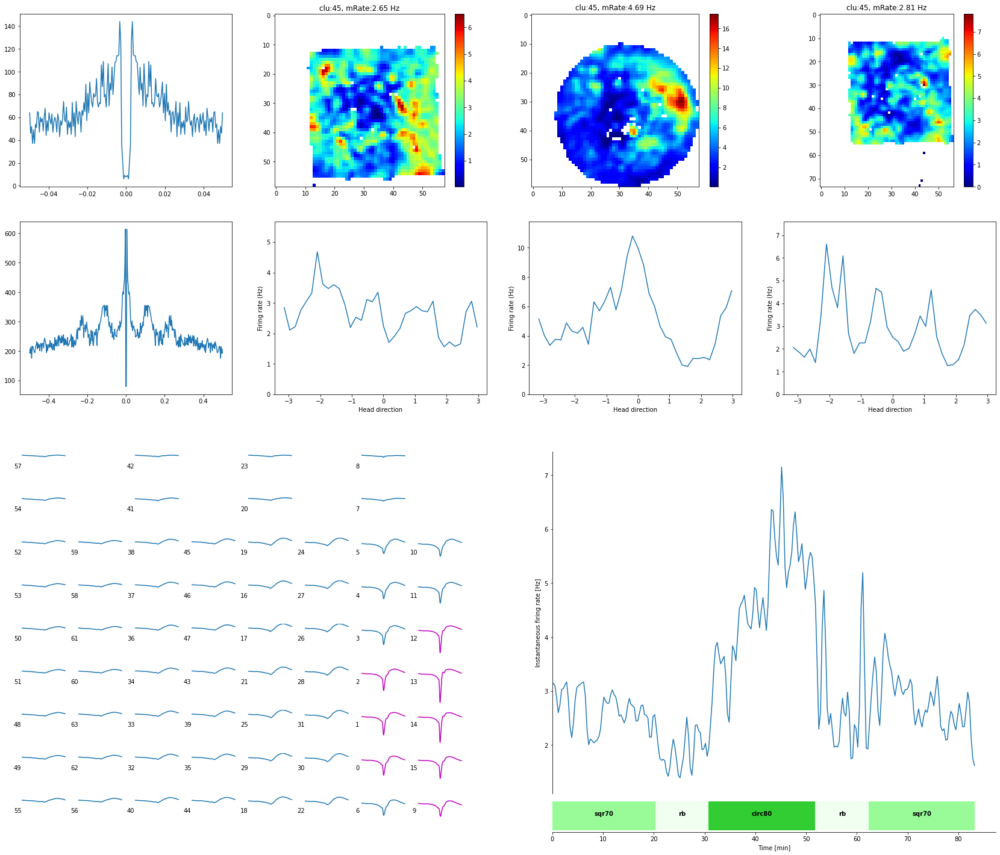

 78%|█████████████████████████████████▍         | 28/36 [22:32<07:18, 54.78s/it]

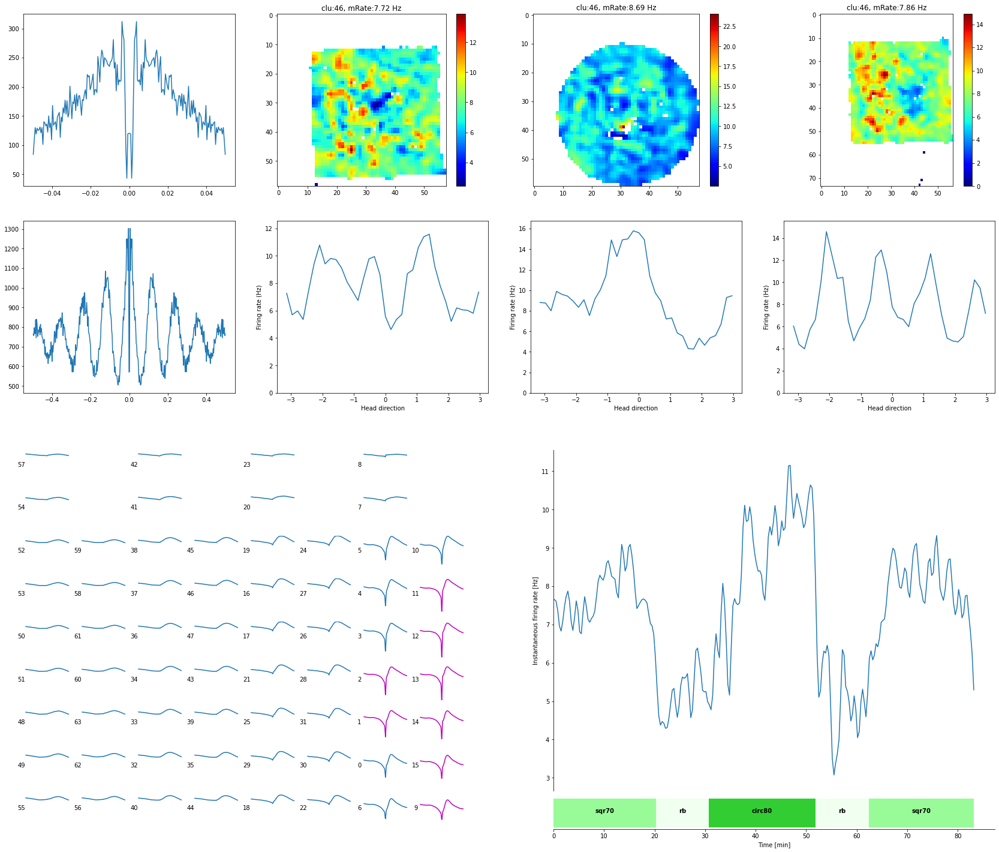

 81%|██████████████████████████████████▋        | 29/36 [23:36<06:43, 57.69s/it]

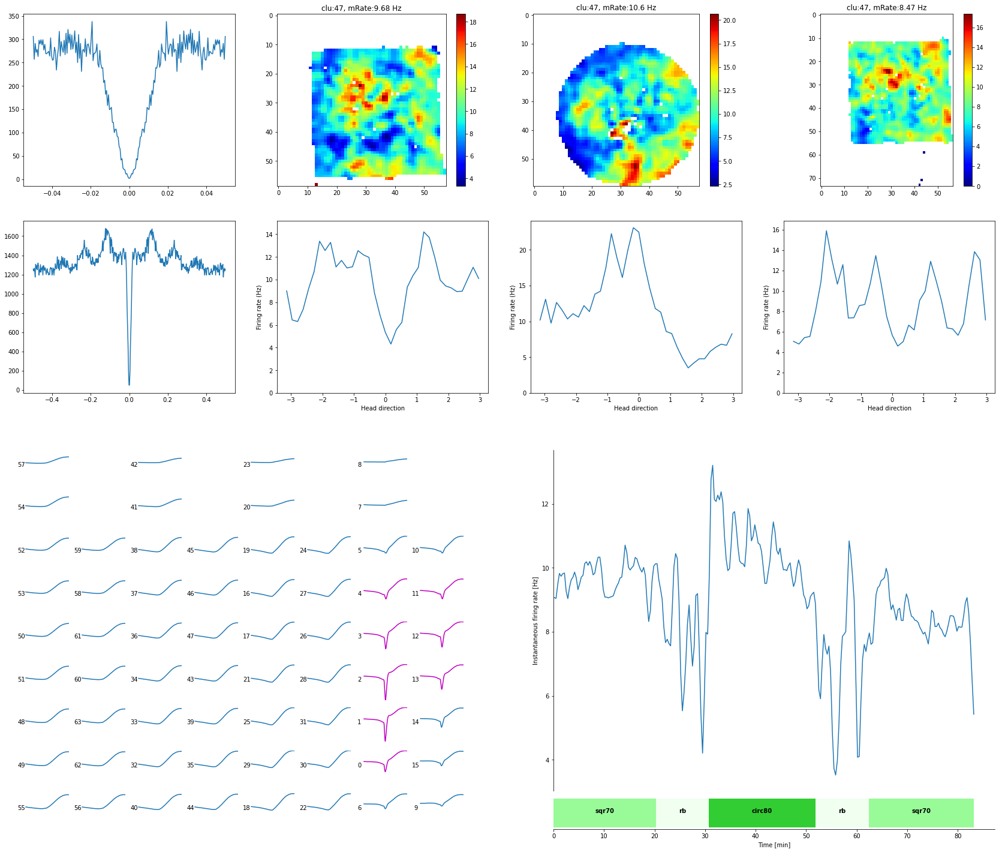

 83%|███████████████████████████████████▊       | 30/36 [24:36<05:50, 58.38s/it]

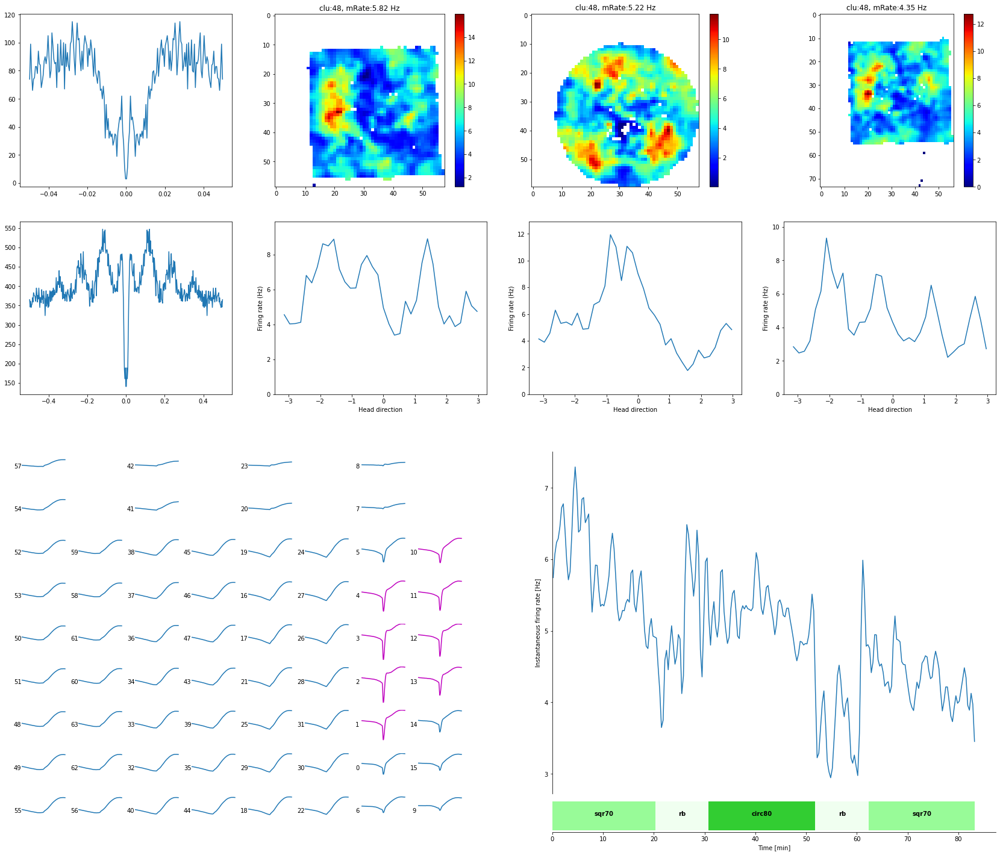

 86%|█████████████████████████████████████      | 31/36 [25:23<04:34, 54.96s/it]

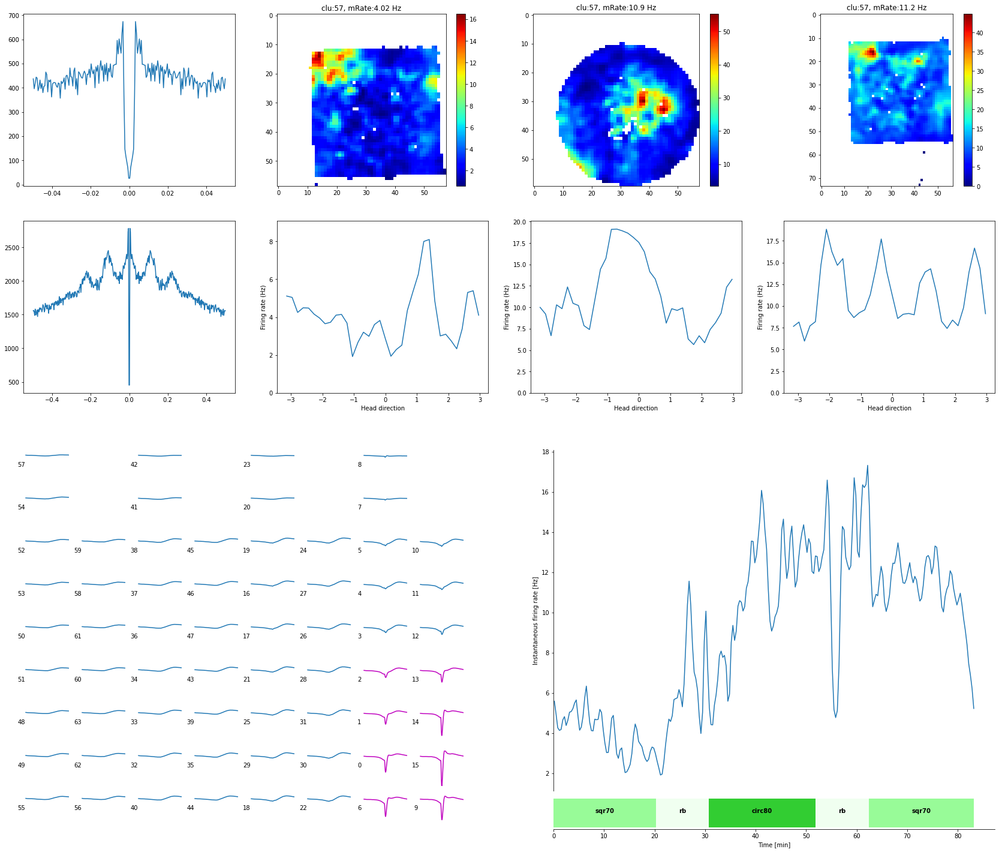

 89%|██████████████████████████████████████▏    | 32/36 [26:10<03:29, 52.42s/it]

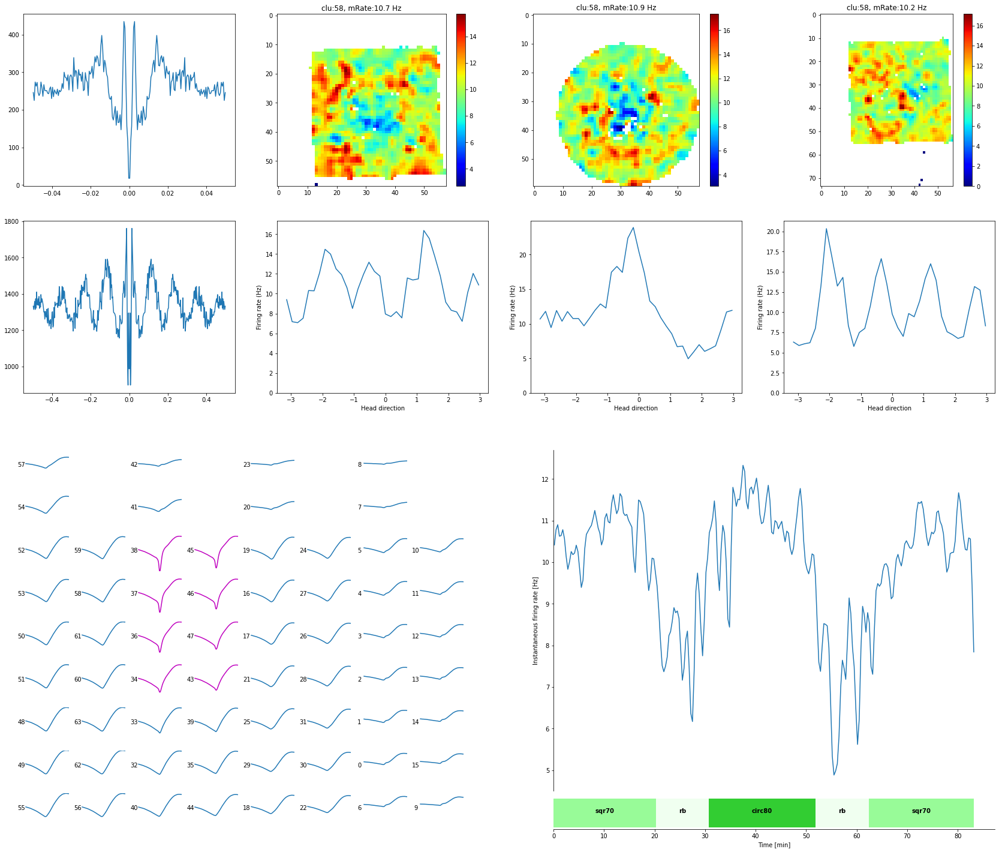

 92%|███████████████████████████████████████▍   | 33/36 [27:16<02:50, 56.73s/it]

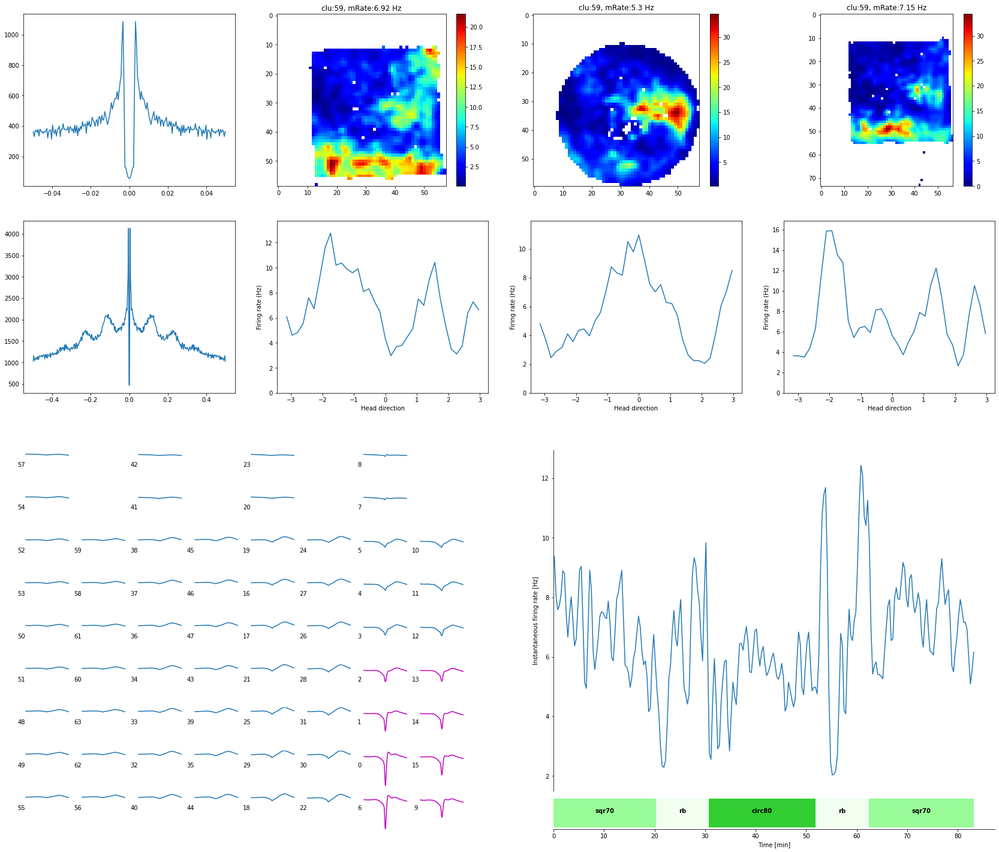

 94%|████████████████████████████████████████▌  | 34/36 [28:08<01:50, 55.14s/it]

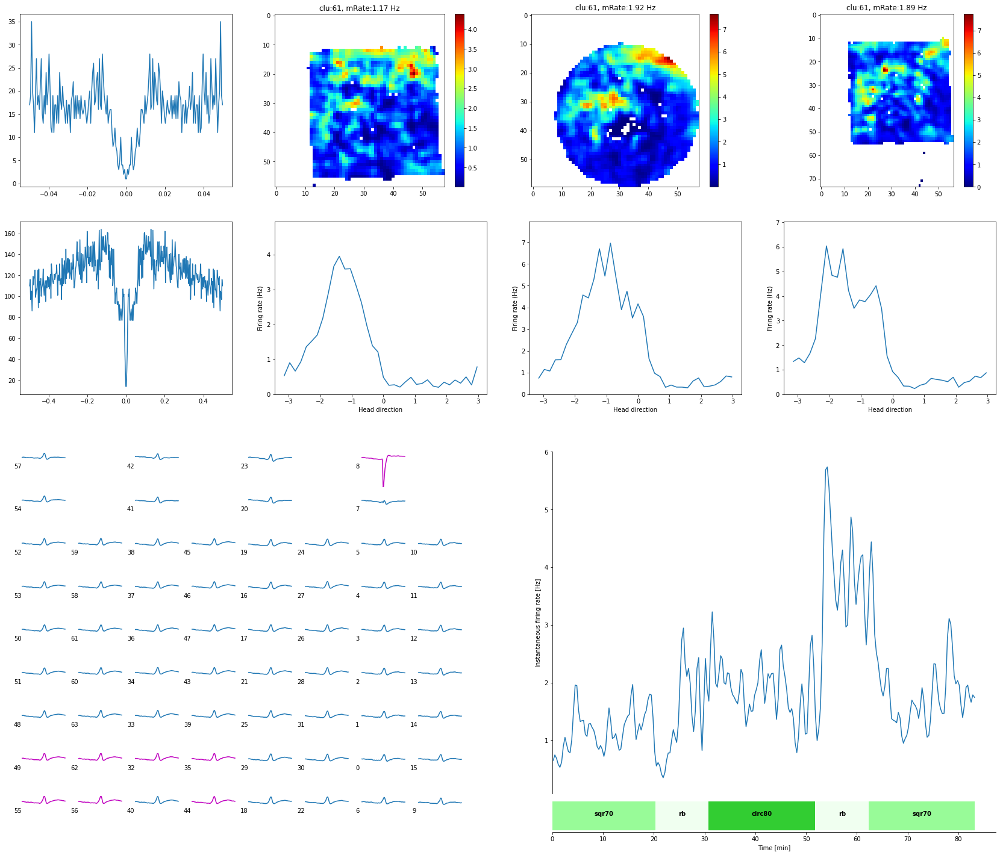

 97%|█████████████████████████████████████████▊ | 35/36 [28:29<00:45, 45.02s/it]

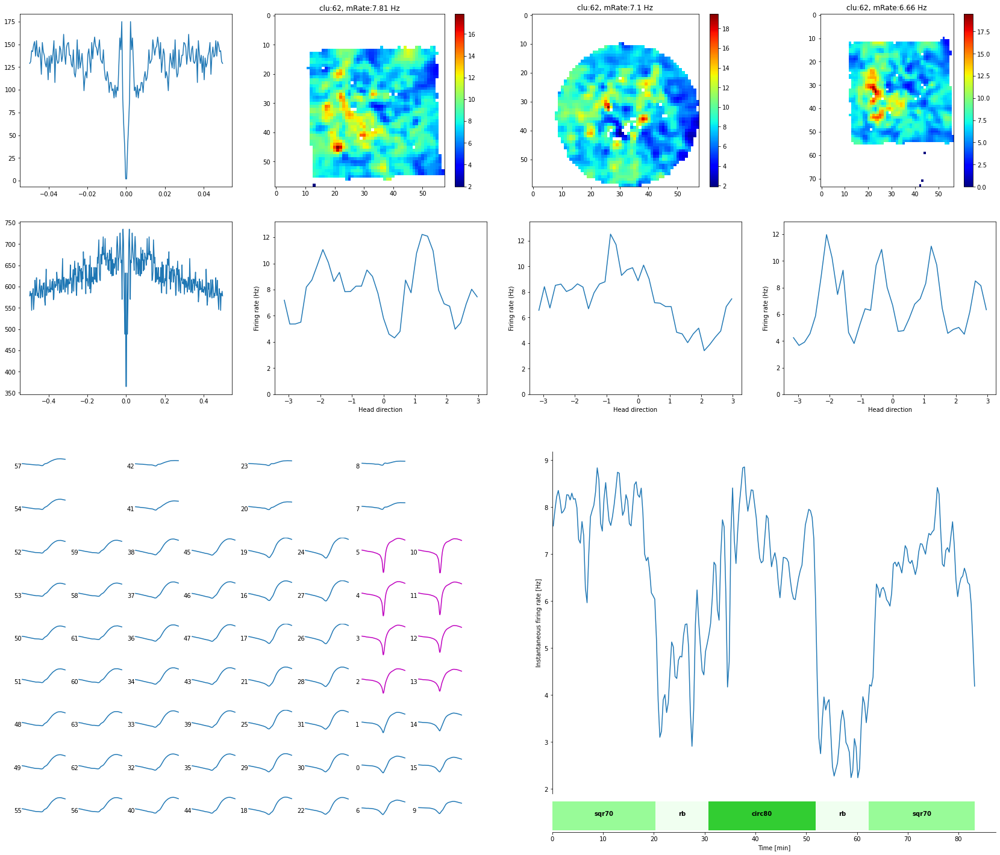

100%|███████████████████████████████████████████| 36/36 [29:22<00:00, 48.96s/it]


In [923]:
summary_file = f'/home/beate/summaries/{mouse}/waveform/{name}_wf.pdf'
if not os.path.exists(f'/home/beate/summaries/{mouse}/waveform/'):
    os.mkdir(f'/home/beate/summaries/{mouse}/')
    
# for stacked bar chart with environments
trial_intervals = (ses.trial_intervals.inter[n[0]][-1] for n in enumerate(ses.trial_intervals.inter))
trial_duration = [x/60 for x in trial_intervals] # convert to min
trial_duration.insert(0,0)
trial_duration = [trial_duration[n+1] - trial_duration[n] for n in (range(len(trial_duration)-1))]
colors = ['palegreen', 'honeydew', 'limegreen', 'honeydew', 'palegreen']
labels = ses.desen # figure and axis
        
## for waveform plot
df = Dat_file_reader(file_names=[f"{path}{mouse}-{date}-0105.dat"], n_channels=65)
# plot all channels in the A4x16 configuration
# create the specific location of the sites for A4x16 probes
upper_sites = [((n+1)*16-1) for n in range(4)] + [((n+1)*16-2) for n in range(4)]
ch_map = np.load(f"{path}channel_map.npy")
rows = np.tile(np.flip(range(9)), 4)
rows = np.repeat(rows,2,axis=0)
cols = (np.repeat([[1,0],[3,2],[5,4],[7,6]],9,axis=0))
cols = cols.flatten()
ax_map = [(row, col) for (row, col) in zip(rows, cols)]


with PdfPages(summary_file) as pdf:
    for i, n in enumerate(tqdm(cg.neuron_list)):
        fig = plt.figure(figsize=(25,25), constrained_layout=False)
        outer_layout = gridspec.GridSpec(2, 1, figure=fig, left=0.05, right=0.95, wspace=0.15, hspace=0.15)
        inner_layout_upper = gridspec.GridSpecFromSubplotSpec(2, 4, subplot_spec=outer_layout[0])
        #fig = plt.figure(figsize=(25,25), constrained_layout=False)
        #layout = fig.add_gridspec(nrows=3, ncols=4, left=0.05, right=0.95, wspace=0.15, hspace=0.15)
        n.spike_train.unset_intervals()
        
        n.spike_train.spike_time_autocorrelation(bin_size_sec=0.0005,min_sec=-0.05, max_sec=0.05)
        timestamp = n.spike_train.mid_point_from_edges(n.spike_train.st_autocorrelation_histogram[1])
        ax0 = fig.add_subplot(inner_layout_upper[0, 0])
        ax0.plot(timestamp, n.spike_train.st_autocorrelation_histogram[0])

        n.spike_train.spike_time_autocorrelation(bin_size_sec=0.0025,min_sec=-0.5, max_sec=0.5)
        timestamp = n.spike_train.mid_point_from_edges(n.spike_train.st_autocorrelation_histogram[1])
        ax1 = fig.add_subplot(inner_layout_upper[1, 0])
        ax1.plot(timestamp, n.spike_train.st_autocorrelation_histogram[0])

        ax0 = ax1 = [None]*len([first_sqr70_inter,first_circ80_inter,last_sqr70_inter])
        for j, interv in enumerate([first_sqr70_inter,first_circ80_inter,last_sqr70_inter]):
            n.spike_train.unset_intervals()
            ap.unset_intervals()
            n.spike_train.set_intervals(interv)
            ap.set_intervals(interv)

            n.set_spatial_properties(ap)
            n.spatial_properties.firing_rate_map_2d(cm_per_bin =2, smoothing_sigma_cm = 2, smoothing=True)
            ax0[j] = fig.add_subplot(inner_layout_upper[0, 1+j])
            im = ax1[j].imshow(n.spatial_properties.firing_rate_map,cmap='jet')
            ax0[j].set_title("clu:{}, mRate:{:.3} Hz".format(n.name,n.spike_train.mean_firing_rate()))
            fig.colorbar(im,ax=ax0[j])

            n.spatial_properties.firing_rate_head_direction_histogram(smoothing=False)
            ax1[j] = fig.add_subplot(inner_layout_upper[1, 1+j])
            ax1[j].plot(n.spatial_properties.firing_rate_head_direction_histo_edges[:-1],n.spatial_properties.firing_rate_head_direction_histo)
            ax1[j].set_xlabel("Head direction")
            ax1[j].set_ylabel("Firing rate (Hz)")
            ax1[j].set_ylim(0,np.max(n.spatial_properties.firing_rate_head_direction_histo)+1)
        
        # calculate the instaneous firing rate
        n.spike_train.unset_intervals()
        n.spike_train.instantaneous_firing_rate(bin_size_ms=20000)
        # take average of consecutive values and convert from ms to min
        timepoints = 0.5*(n.spike_train.ifr[2][1:] + n.spike_train.ifr[2][:-1])/1000/60

        inner_layout_lower = gridspec.GridSpecFromSubplotSpec(1, 2, subplot_spec=outer_layout[1])
        inner_layout_lower_right = gridspec.GridSpecFromSubplotSpec(10, 1, subplot_spec=inner_layout_lower[1])
        ax2 = fig.add_subplot(inner_layout_lower_right[0:9])
        ax3 = fig.add_subplot(inner_layout_lower_right[9])
        ax2.plot(timepoints, n.spike_train.ifr[0])

        left = 0
        for trial,intervals in enumerate(trial_duration):
            ax3.barh(0, intervals, left = left, color=colors[trial]) #plot environments as stacked bar
            ax3.text((intervals*0.5 + left), 0, labels[trial], ha='center', weight = 'bold') # label environments
            left = left + intervals

        #ax2.set_title("Instantaneous firing rate during the whole session", weight = 'bold')
        ax2.set_ylabel("Instantaneous firing rate [Hz]")
        ax3.set_xlabel("Time [min]")
        ax2.spines['right'].set_visible(False); ax3.spines['right'].set_visible(False)
        ax3.spines['left'].set_visible(False)
        ax2.spines['top'].set_visible(False); ax3.spines['top'].set_visible(False)
        ax2.spines['bottom'].set_visible(False)
        ax3.set_axisbelow(True)
        ax3.get_yaxis().set_visible(False)
        ax2.get_xaxis().set_visible(False)
        ax3.get_xaxis()
        ax2.get_shared_x_axes().join(ax3, ax2)
        
        # plot the wave forms
        inner_layout_lower_left = gridspec.GridSpecFromSubplotSpec(9, 8, subplot_spec=inner_layout_lower[0])
        n_ax = 0
        sw = Spike_waveform(dat_file=df, spike_train=n.spike_train)
        sw.mean_waveform(block_size=200, channels=range(64)) #calculate the mean waveforms for all channels over a time interval of 200 ms
        
        # get the n_channels channels with the highest amplitudes
        n_channels = 8
        amplitudes = [abs(max(sw.mean_waveforms[n,:])) + abs(min(sw.mean_waveforms[n,:])) for n in range(sw.mean_waveforms.shape[0])]
        channel_amp_list = [(c,a) for c,a in zip(amplitudes, range(sw.mean_waveforms.shape[0]))]
        channel_amp_dict = dict(channel_amp_list)
        amp_sorted_channels = [channel_amp_dict[a] for a in sorted(channel_amp_dict)]
        channels = amp_sorted_channels[:(sw.mean_waveforms.shape[0]-n_channels-1):-1]

        for n in range(sw.mean_waveforms.shape[0]):
            if n in upper_sites:
                ax = fig.add_subplot(inner_layout_lower_left[ax_map[n_ax][0],(ax_map[n_ax][1]-1):(ax_map[n_ax][1])])
                n_ax += 2
            else:
                ax = fig.add_subplot(inner_layout_lower_left[ax_map[n_ax]])
                n_ax += 1
            if ch_map[n] in channels:
                ax.plot(sw.mean_waveforms[np.squeeze(ch_map[n]),:], 'm')
            else:
                ax.plot(sw.mean_waveforms[np.squeeze(ch_map[n]),:])    
            ax.spines['right'].set_visible(False)
            ax.spines['left'].set_visible(False)
            ax.spines['top'].set_visible(False)
            ax.spines['bottom'].set_visible(False)
            ax.set_ylabel(np.squeeze(ch_map[n]), rotation=0)
            ax.yaxis.set_ticks([])
            ax.set_ylim(sw.mean_waveforms[:,:].min(), sw.mean_waveforms[:,:].max())
            ax.get_xaxis().set_visible(False)
           
        pdf.savefig(fig)  # saves the current figure into a pdf page
        plt.show()
        plt.close()